In [18]:
# -*- coding: utf-8 -*-
"""
Created on Mon Jan 11 23:11:11 2021

@author: toki6
"""

import numpy as np
import matplotlib.pyplot as plt
import numba as nb


In [19]:
@nb.jit('f8[:,:](i8,i8,f8,f8,f8[:,:],f8[:,:])',nopython=True)
def cal_sf(nx,ny,idx,idy,sf,om):
    for i in range(1,ny-1):
        for j in range(1,nx-1):
            sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
    return sf

@nb.jit('f8[:,:](i8,i8,f8,f8,f8,f8,f8[:,:],f8[:,:])',nopython=True)
def cal_om(nx,ny,idx,idy,dt,ire,sf,om):
    for i in range(1,ny-1):
        for j in range(1,nx-1):
            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    return om

In [3]:
re=200
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)


In [4]:
idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)


In [5]:
U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

In [6]:
nx2=int(nx/6)
ny2=int(ny/2)

#nx3=int(nx/3)
#ny3=int(3*ny/8)
#
#nx4=int(nx/3)
#ny4=int(5*ny/8)

print(nx2,ny2)

80 64


0


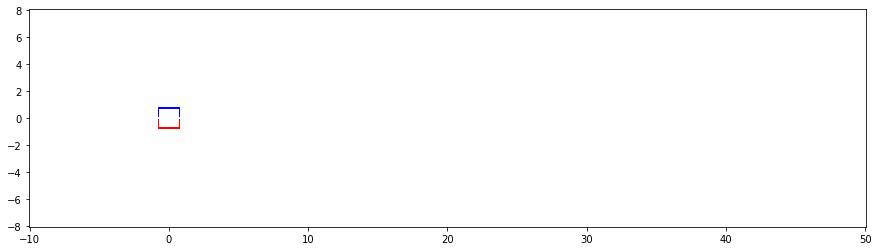

25000


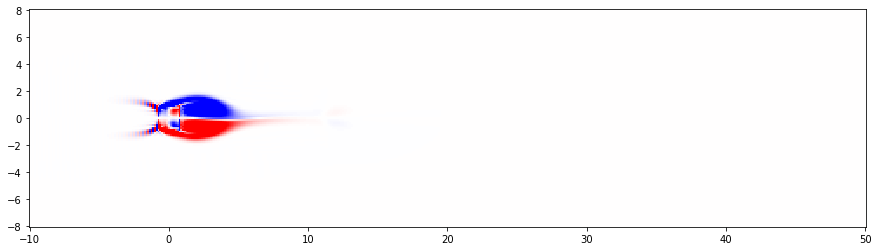

50000


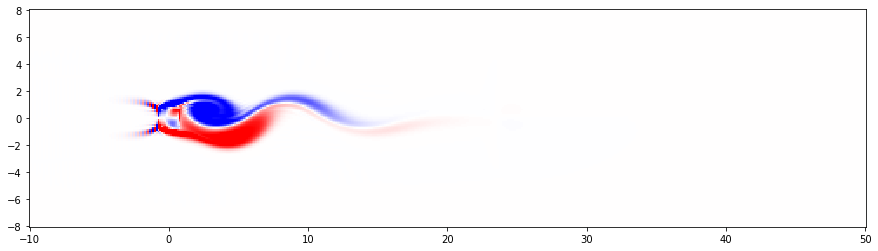

75000


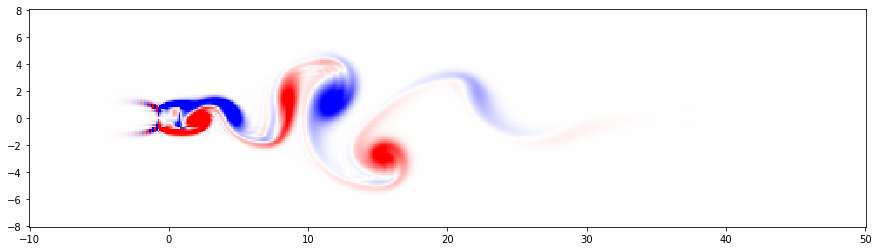

100000


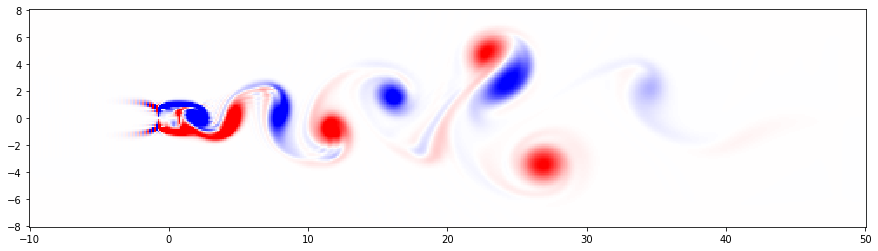

125000


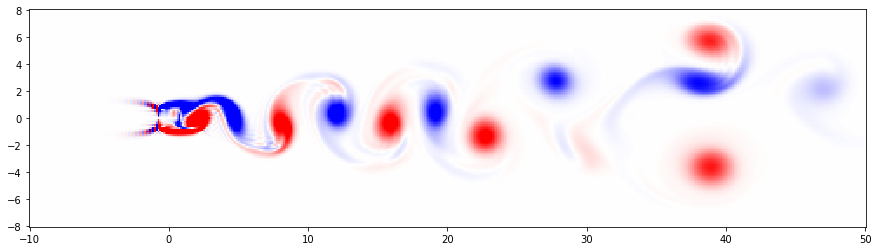

150000


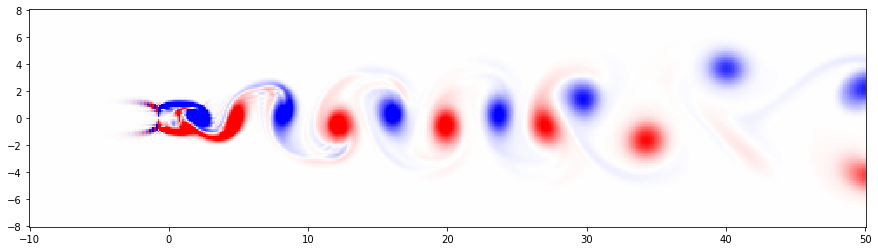

175000


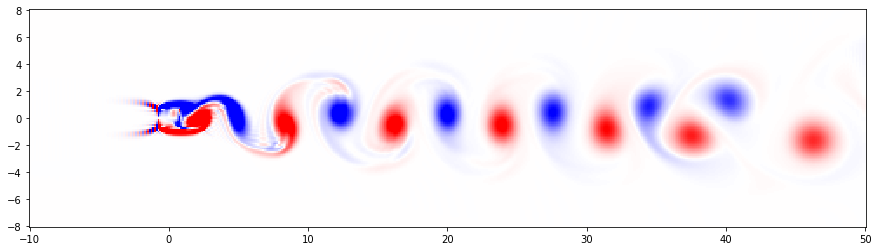

200000


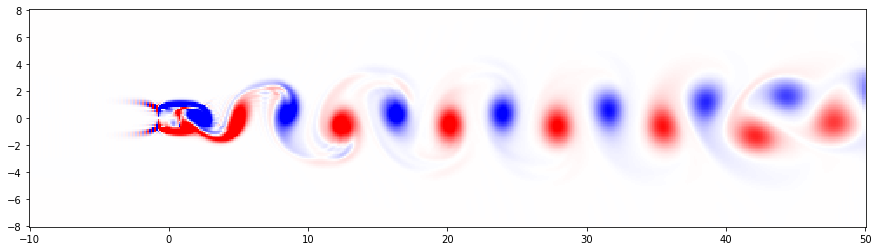

In [7]:
loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        #sf[ny3+i-obs1,nx3-obs2]=0.
        #om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        #sf[ny3+i-obs1,nx3+obs2]=0.
        #om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        #sf[ny4+i-obs1,nx4-obs2]=0.
        #om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        #sf[ny4+i-obs1,nx4+obs2]=0.
        #om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx3+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        #sf[ny3-obs2,nx3+j-obs1]=0.
        #om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        #sf[ny3+obs2,nx3+j-obs1]=0.
        #om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        #sf[ny4-obs2,nx4+j-obs1]=0.
        #om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        #sf[ny4+obs2,nx4+j-obs1]=0.
        #om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny3-obs2,nx3-obs2]=0.
    #om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny3+obs2,nx3-obs2]=0.
    #om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny3+obs2,nx3+obs2]=0.
    #om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny3-obs2,nx3+obs2]=0.
    #om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny4-obs2,nx4-obs2]=0.
    #om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny4+obs2,nx4-obs2]=0.
    #om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny4+obs2,nx4+obs2]=0.
    #om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny4-obs2,nx4+obs2]=0.
    #om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)     

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\1464079809.py:7: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\1464079809.py:8: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


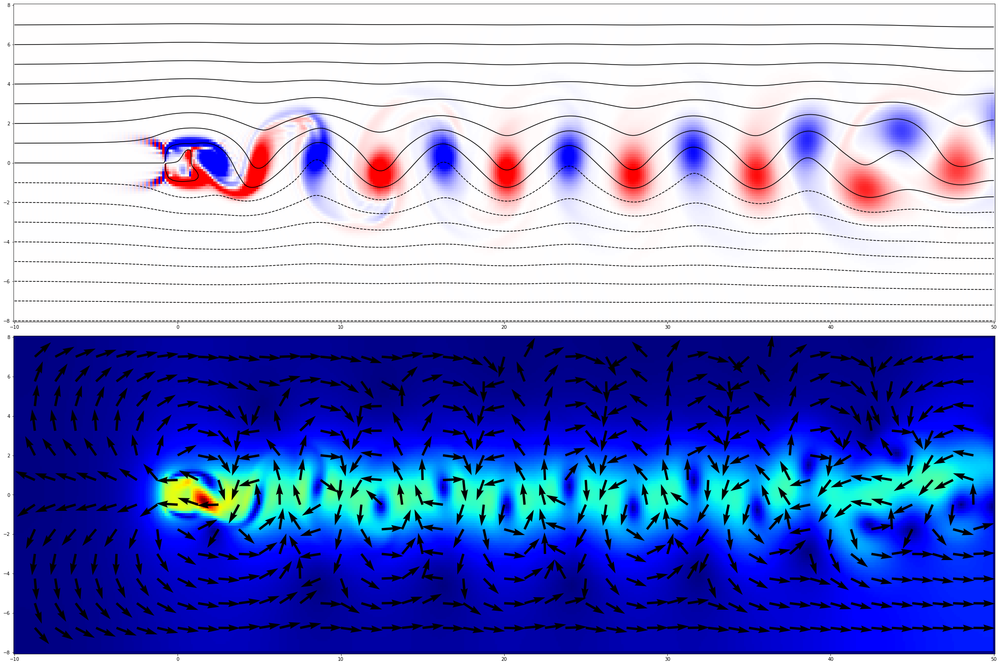

In [8]:
for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

0


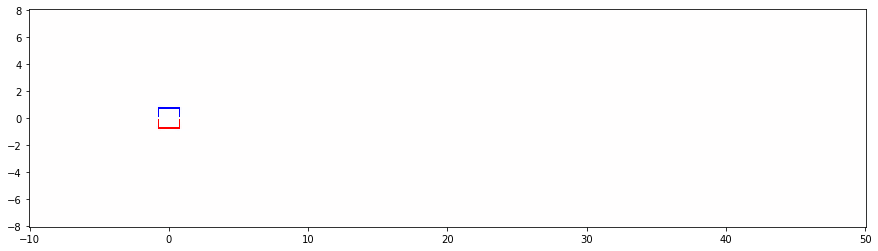

25000


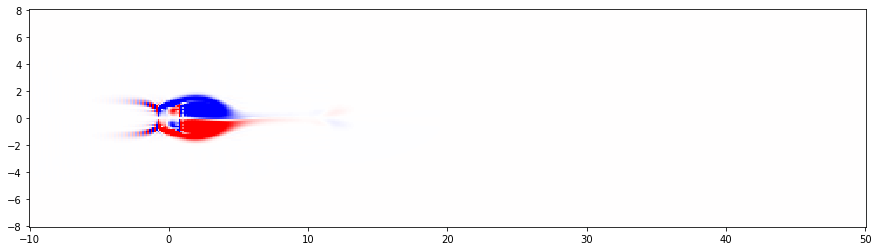

50000


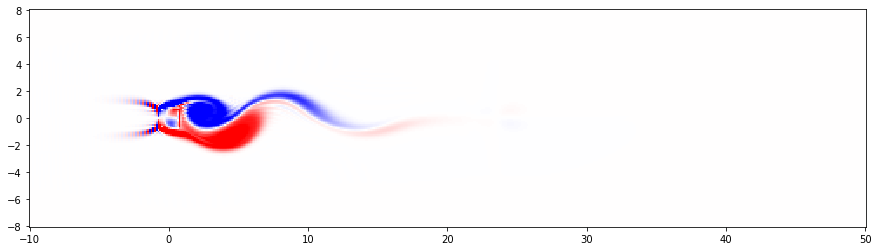

75000


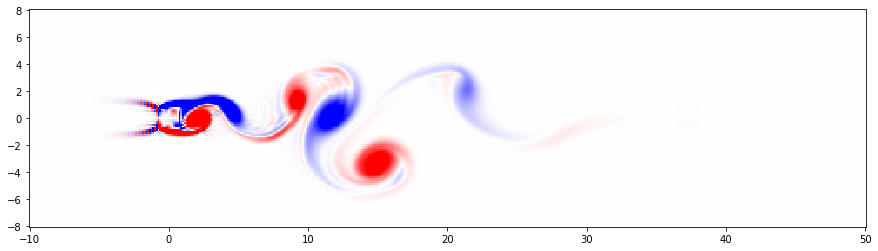

100000


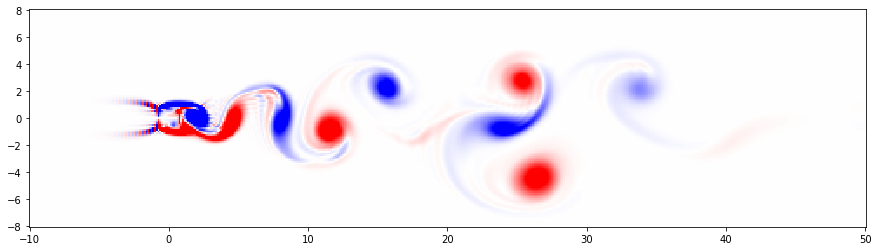

125000


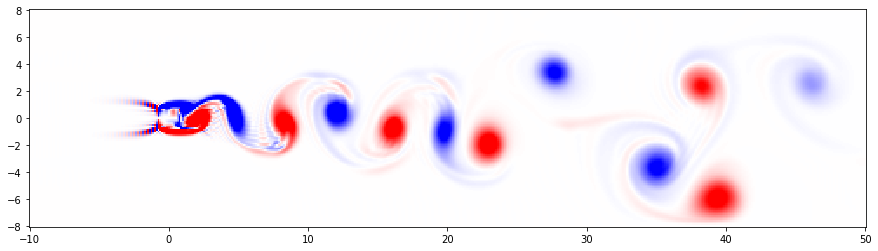

150000


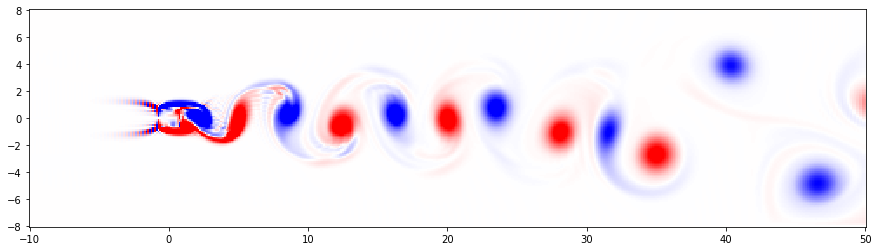

175000


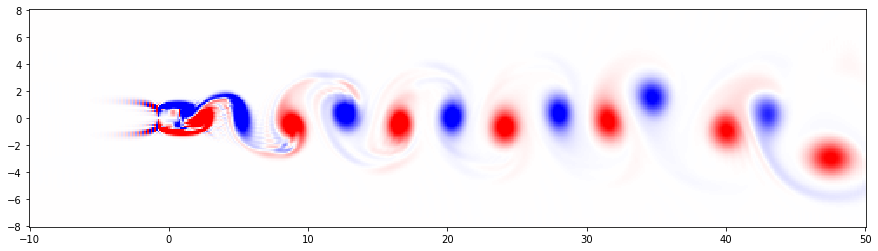

200000


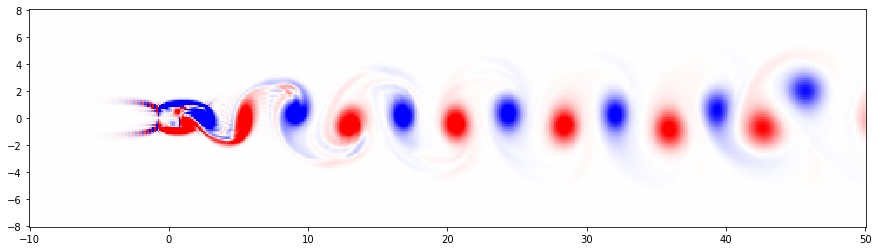

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\3128591063.py:167: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\3128591063.py:168: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


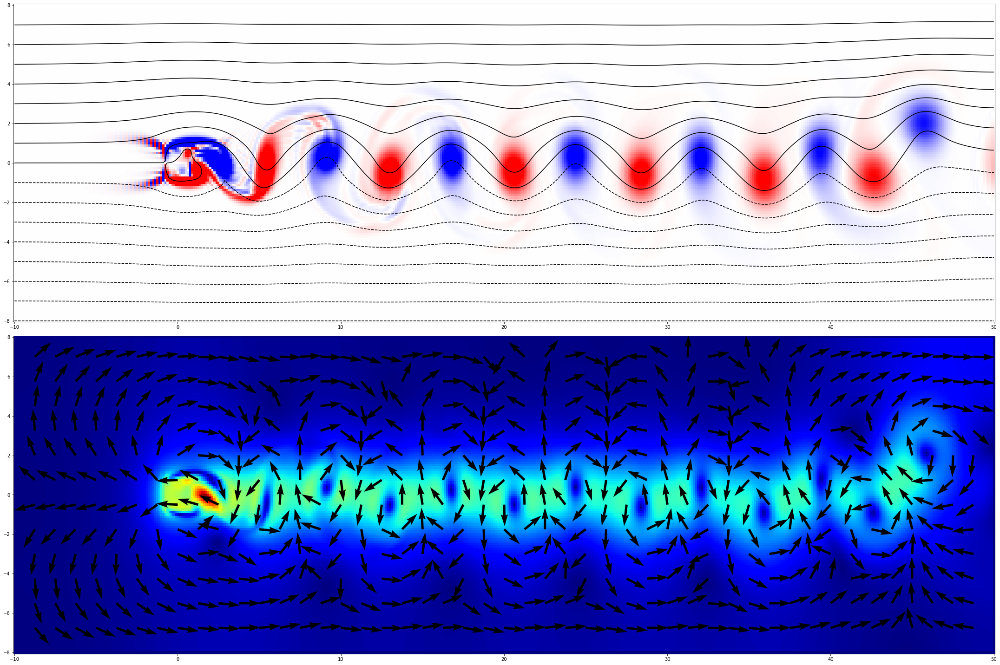

In [9]:
re=250
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

#nx3=int(nx/3)
#ny3=int(3*ny/8)
#
#nx4=int(nx/3)
#ny4=int(5*ny/8)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        #sf[ny3+i-obs1,nx3-obs2]=0.
        #om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        #sf[ny3+i-obs1,nx3+obs2]=0.
        #om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        #sf[ny4+i-obs1,nx4-obs2]=0.
        #om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        #sf[ny4+i-obs1,nx4+obs2]=0.
        #om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx3+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        #sf[ny3-obs2,nx3+j-obs1]=0.
        #om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        #sf[ny3+obs2,nx3+j-obs1]=0.
        #om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        #sf[ny4-obs2,nx4+j-obs1]=0.
        #om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        #sf[ny4+obs2,nx4+j-obs1]=0.
        #om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny3-obs2,nx3-obs2]=0.
    #om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny3+obs2,nx3-obs2]=0.
    #om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny3+obs2,nx3+obs2]=0.
    #om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny3-obs2,nx3+obs2]=0.
    #om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny4-obs2,nx4-obs2]=0.
    #om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny4+obs2,nx4-obs2]=0.
    #om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny4+obs2,nx4+obs2]=0.
    #om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny4-obs2,nx4+obs2]=0.
    #om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)    

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close() 

0


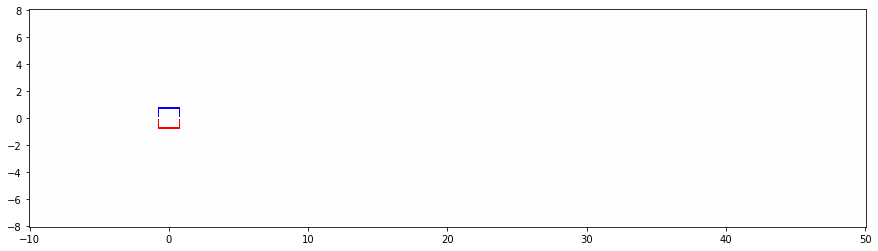

25000


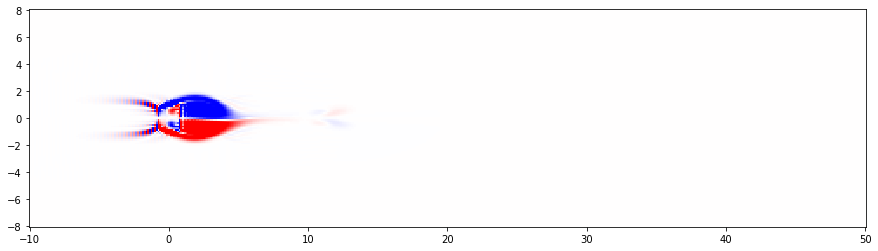

50000


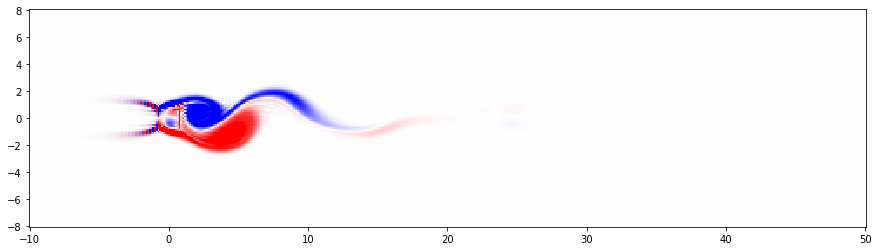

75000


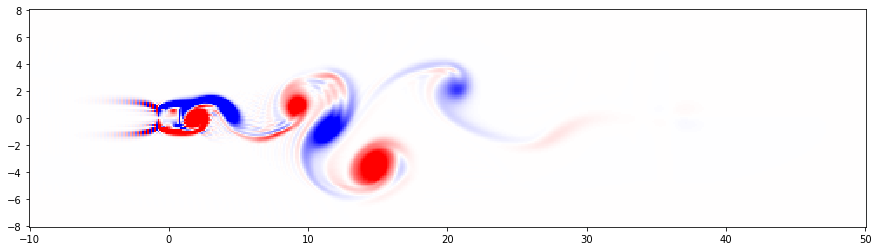

100000


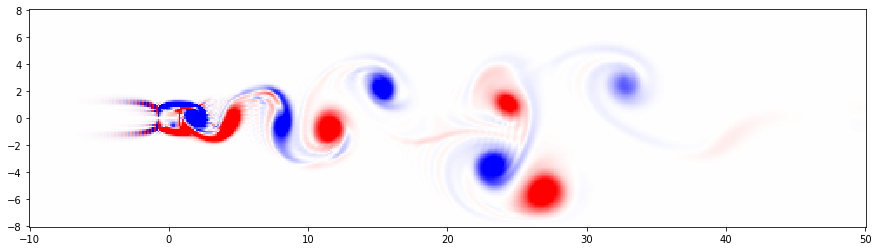

125000


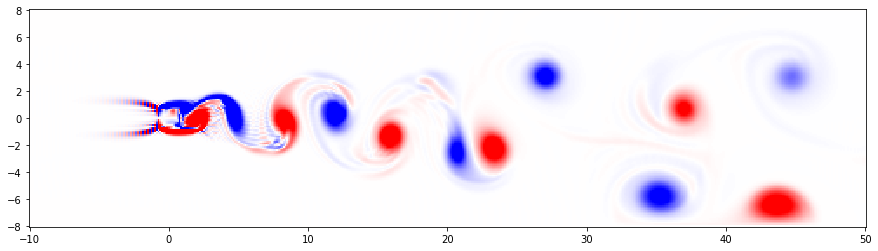

150000


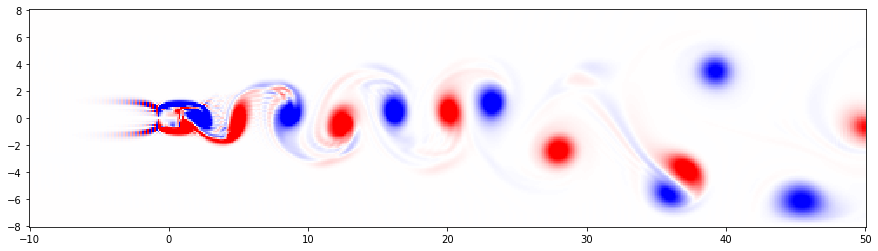

175000


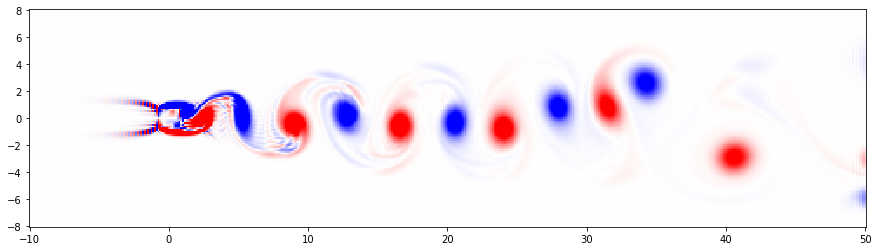

200000


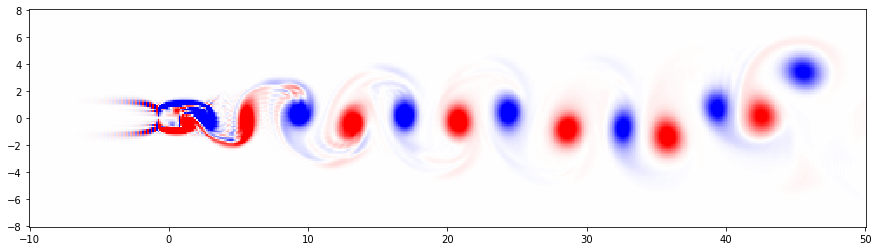

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\1712996023.py:167: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\1712996023.py:168: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


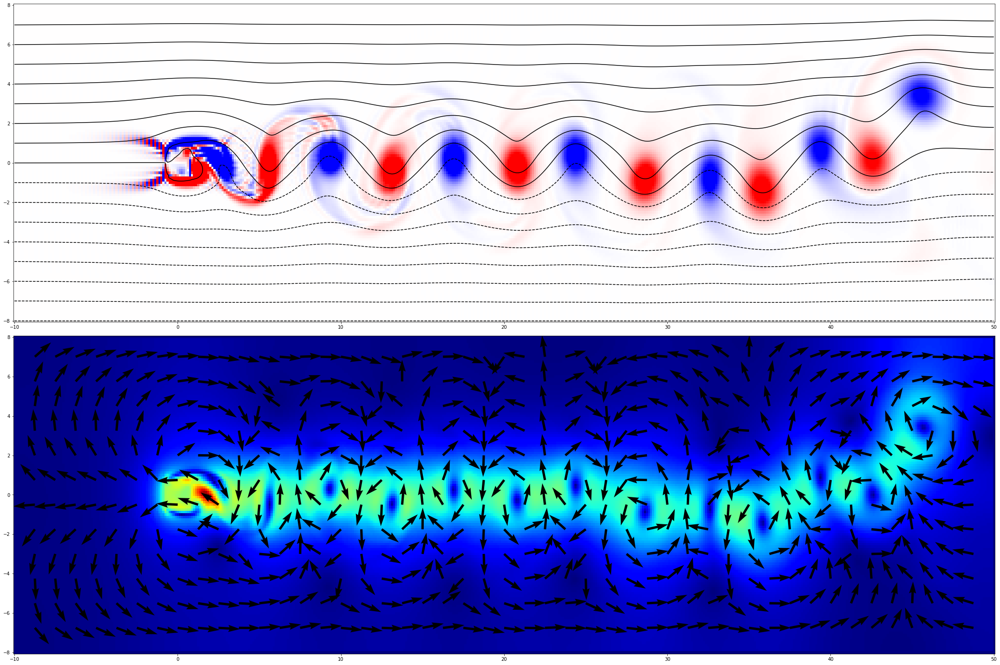

In [10]:
re=300
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

#nx3=int(nx/3)
#ny3=int(3*ny/8)
#
#nx4=int(nx/3)
#ny4=int(5*ny/8)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        #sf[ny3+i-obs1,nx3-obs2]=0.
        #om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        #sf[ny3+i-obs1,nx3+obs2]=0.
        #om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        #sf[ny4+i-obs1,nx4-obs2]=0.
        #om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        #sf[ny4+i-obs1,nx4+obs2]=0.
        #om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx3+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        #sf[ny3-obs2,nx3+j-obs1]=0.
        #om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        #sf[ny3+obs2,nx3+j-obs1]=0.
        #om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        #sf[ny4-obs2,nx4+j-obs1]=0.
        #om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        #sf[ny4+obs2,nx4+j-obs1]=0.
        #om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny3-obs2,nx3-obs2]=0.
    #om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny3+obs2,nx3-obs2]=0.
    #om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny3+obs2,nx3+obs2]=0.
    #om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny3-obs2,nx3+obs2]=0.
    #om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny4-obs2,nx4-obs2]=0.
    #om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny4+obs2,nx4-obs2]=0.
    #om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny4+obs2,nx4+obs2]=0.
    #om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny4-obs2,nx4+obs2]=0.
    #om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)  

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

0


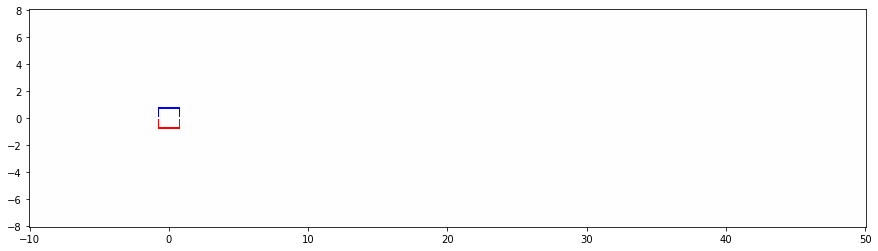

25000


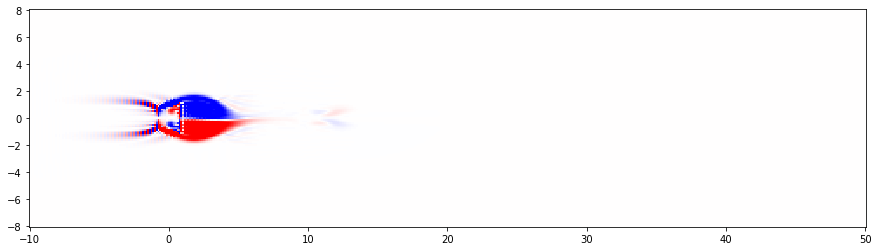

50000


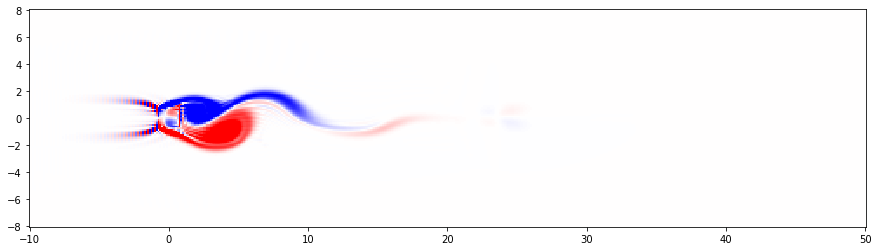

75000


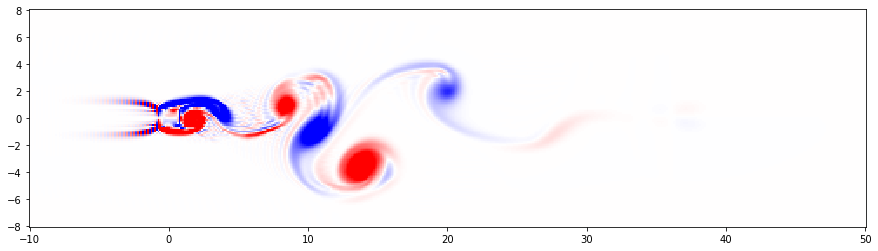

100000


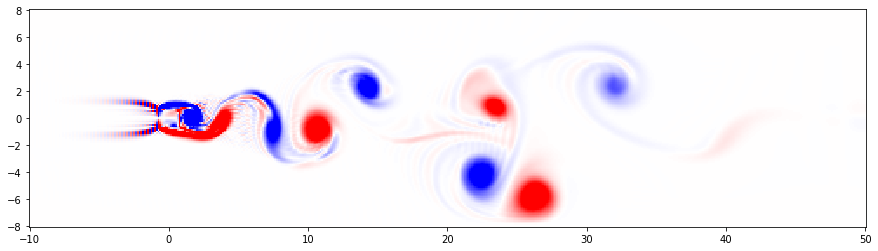

125000


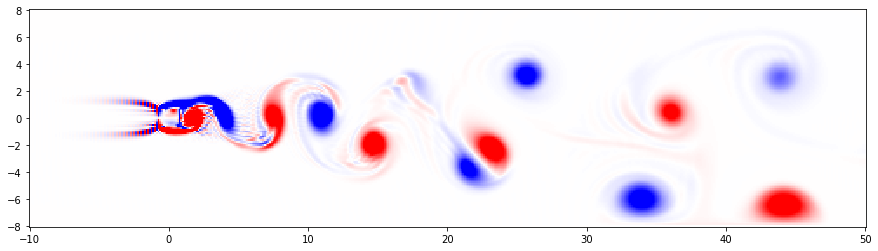

150000


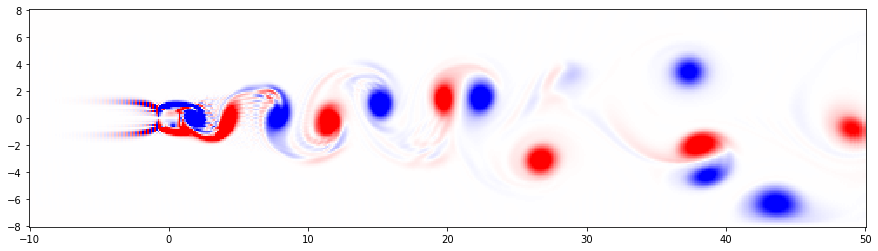

175000


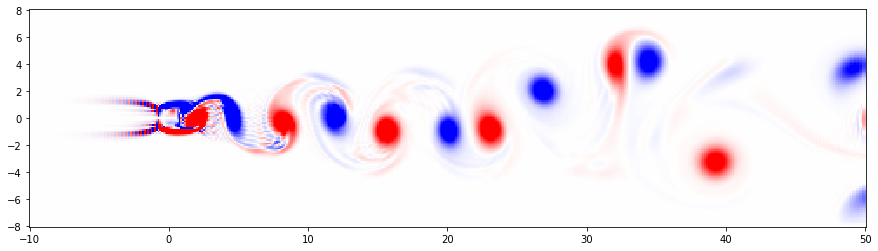

200000


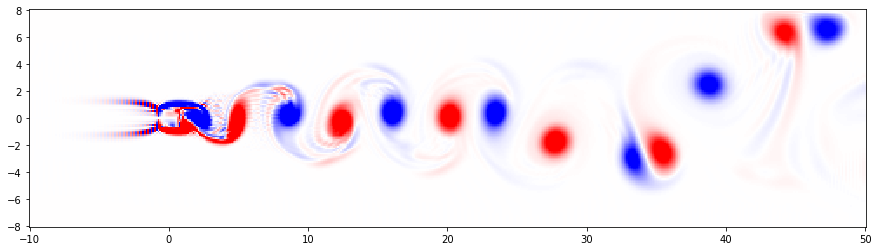

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\194089975.py:167: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\194089975.py:168: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


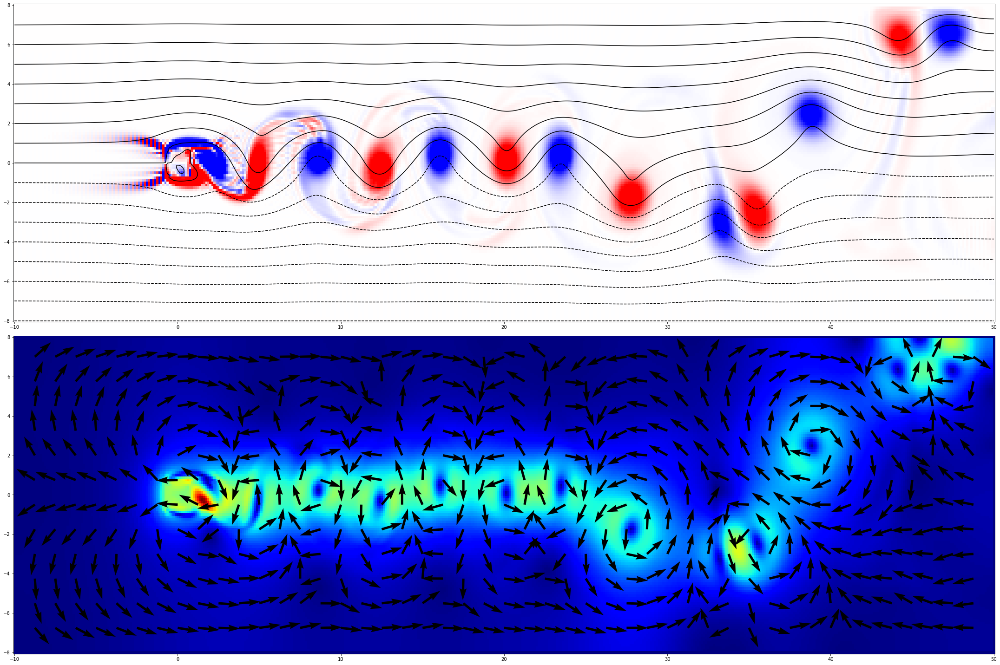

In [11]:
re=350
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

#nx3=int(nx/3)
#ny3=int(3*ny/8)
#
#nx4=int(nx/3)
#ny4=int(5*ny/8)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        #sf[ny3+i-obs1,nx3-obs2]=0.
        #om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        #sf[ny3+i-obs1,nx3+obs2]=0.
        #om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        #sf[ny4+i-obs1,nx4-obs2]=0.
        #om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        #sf[ny4+i-obs1,nx4+obs2]=0.
        #om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx3+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        #sf[ny3-obs2,nx3+j-obs1]=0.
        #om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        #sf[ny3+obs2,nx3+j-obs1]=0.
        #om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        #sf[ny4-obs2,nx4+j-obs1]=0.
        #om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        #sf[ny4+obs2,nx4+j-obs1]=0.
        #om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny3-obs2,nx3-obs2]=0.
    #om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny3+obs2,nx3-obs2]=0.
    #om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny3+obs2,nx3+obs2]=0.
    #om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny3-obs2,nx3+obs2]=0.
    #om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny4-obs2,nx4-obs2]=0.
    #om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny4+obs2,nx4-obs2]=0.
    #om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny4+obs2,nx4+obs2]=0.
    #om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny4-obs2,nx4+obs2]=0.
    #om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)  

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

0


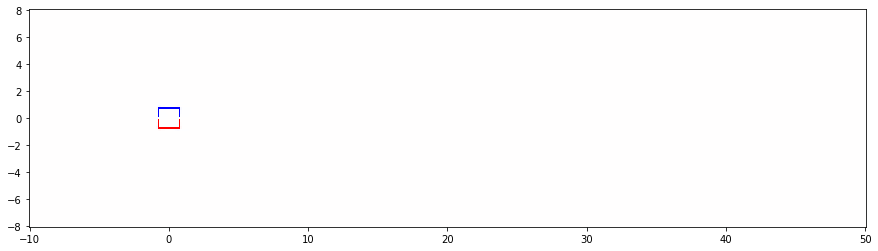

25000


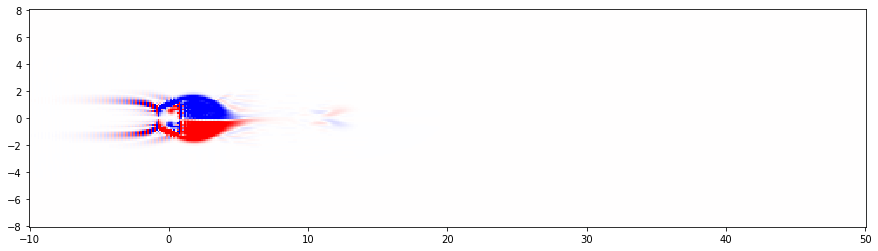

50000


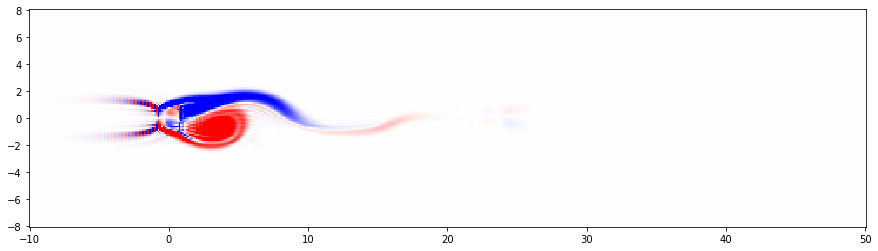

75000


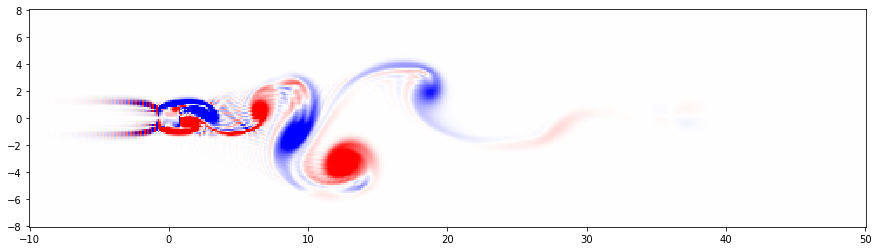

100000


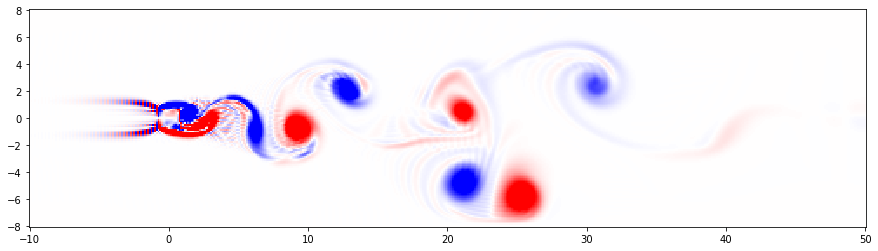

125000


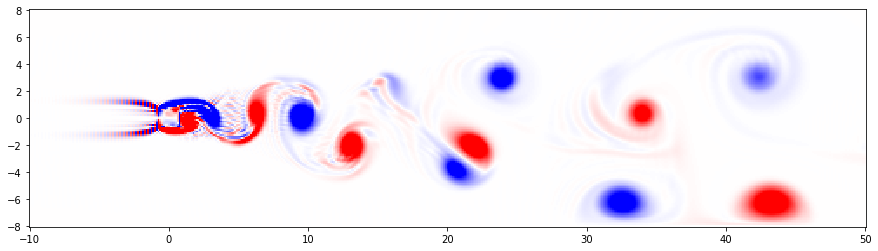

150000


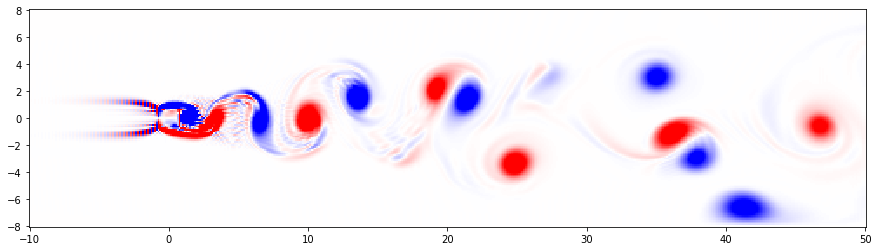

175000


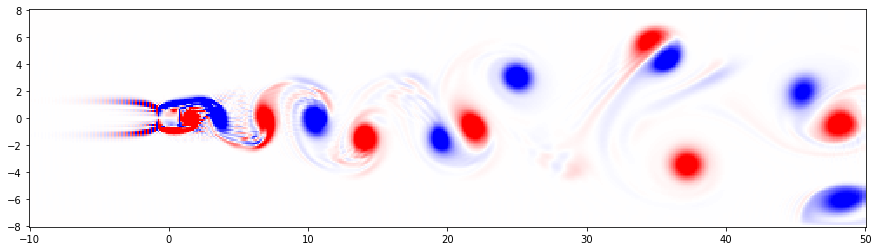

200000


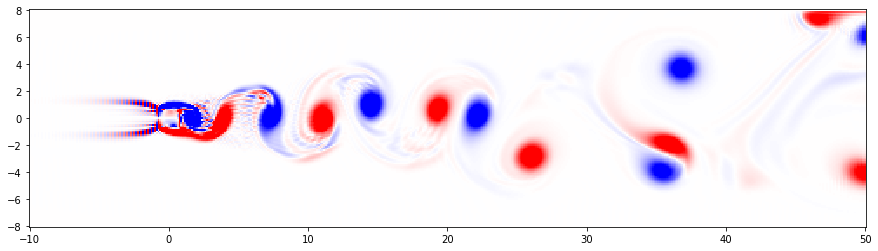

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\3904313956.py:167: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\3904313956.py:168: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


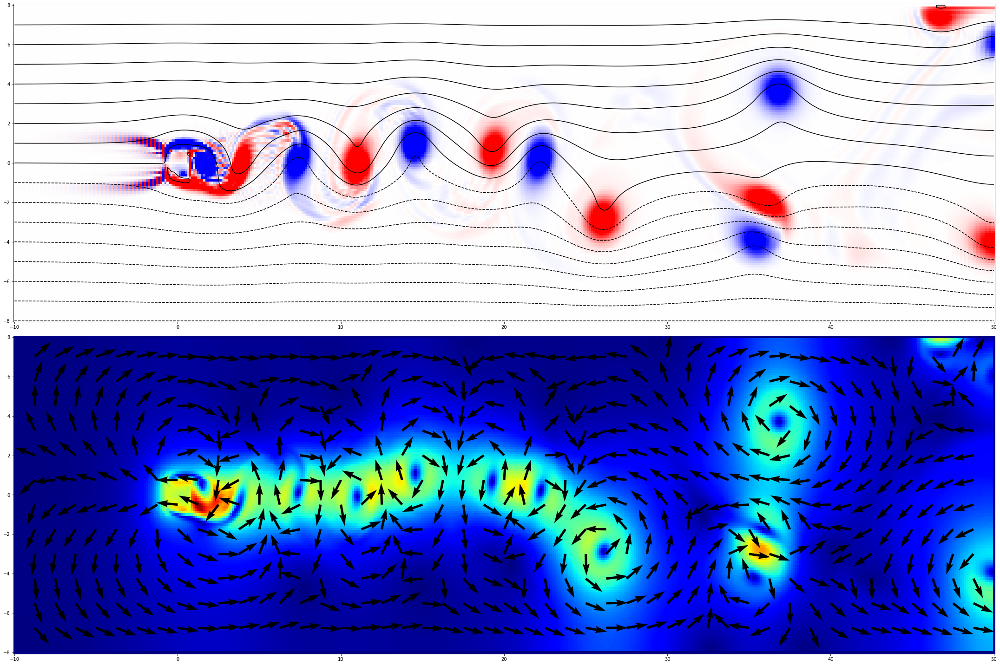

In [12]:
re=400
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

#nx3=int(nx/3)
#ny3=int(3*ny/8)
#
#nx4=int(nx/3)
#ny4=int(5*ny/8)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        #sf[ny3+i-obs1,nx3-obs2]=0.
        #om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        #sf[ny3+i-obs1,nx3+obs2]=0.
        #om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        #sf[ny4+i-obs1,nx4-obs2]=0.
        #om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        #sf[ny4+i-obs1,nx4+obs2]=0.
        #om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx3+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        #sf[ny3-obs2,nx3+j-obs1]=0.
        #om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        #sf[ny3+obs2,nx3+j-obs1]=0.
        #om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        #sf[ny4-obs2,nx4+j-obs1]=0.
        #om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        #sf[ny4+obs2,nx4+j-obs1]=0.
        #om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny3-obs2,nx3-obs2]=0.
    #om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny3+obs2,nx3-obs2]=0.
    #om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny3+obs2,nx3+obs2]=0.
    #om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny3-obs2,nx3+obs2]=0.
    #om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny4-obs2,nx4-obs2]=0.
    #om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny4+obs2,nx4-obs2]=0.
    #om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    #sf[ny4+obs2,nx4+obs2]=0.
    #om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    #sf[ny4-obs2,nx4+obs2]=0.
    #om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)  

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

0


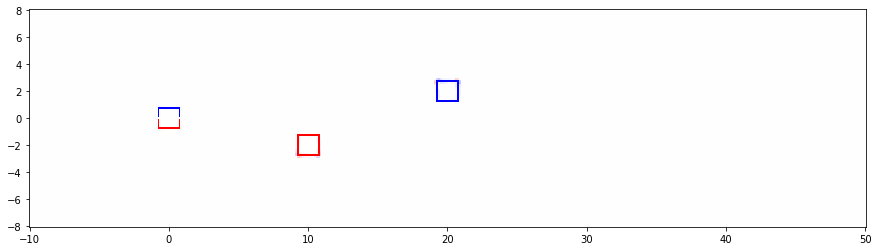

25000


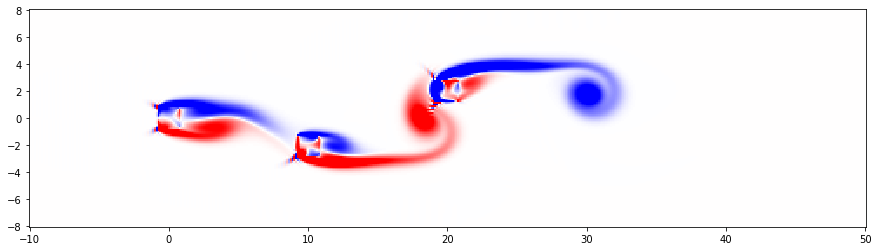

50000


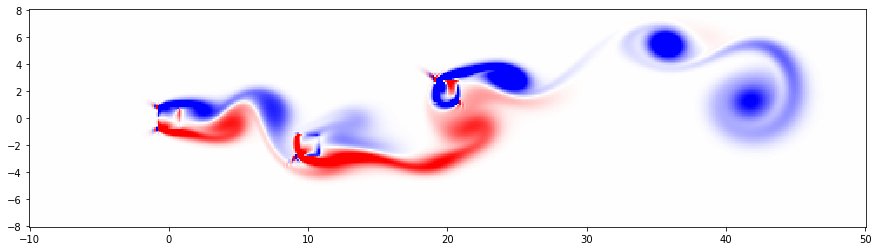

75000


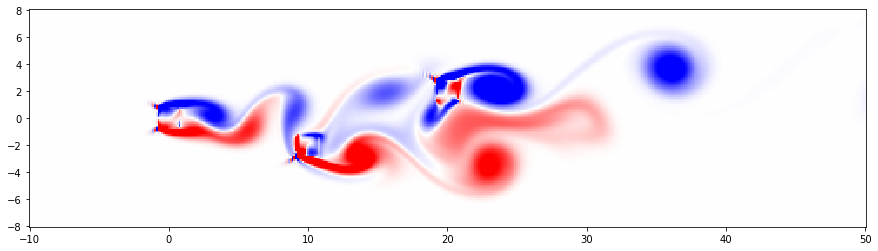

100000


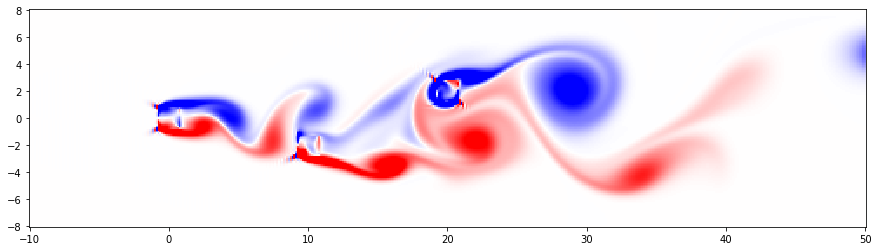

125000


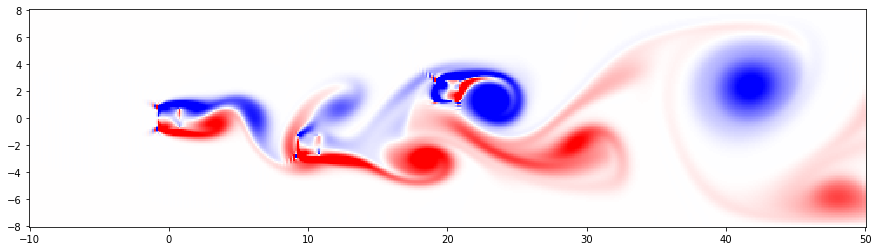

150000


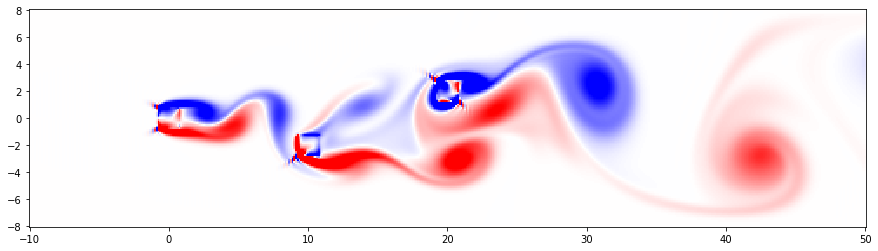

175000


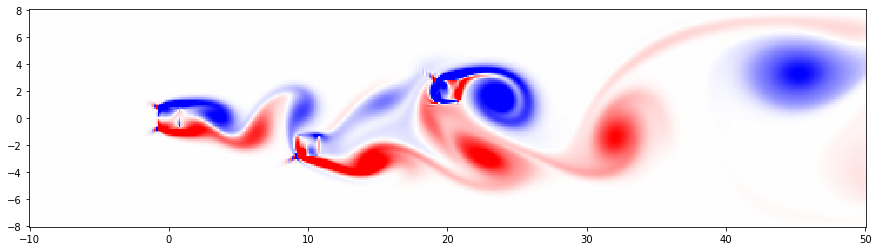

200000


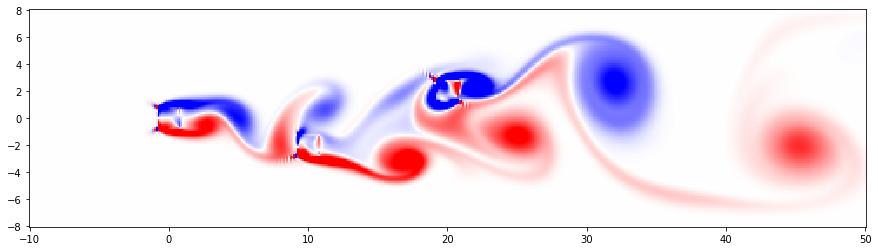

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\226707936.py:167: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\226707936.py:168: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


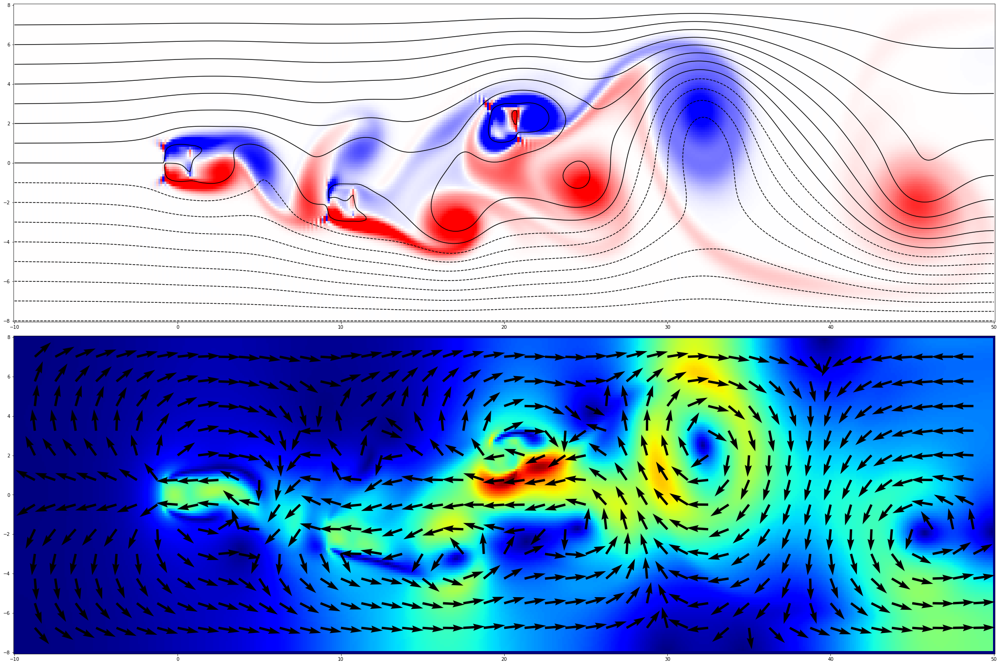

In [13]:
re=75
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

nx3=int(nx/3)
ny3=int(3*ny/8)

nx4=int(nx/2)
ny4=int(5*ny/8)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3-obs2]=0.
        om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3+obs2]=0.
        om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4-obs2]=0.
        om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx4-obs2-2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4+obs2]=0.
        om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx4+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny3-obs2,nx3+j-obs1]=0.
        om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny3+obs2,nx3+j-obs1]=0.
        om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny4-obs2,nx4+j-obs1]=0.
        om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny4+obs2,nx4+j-obs1]=0.
        om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3-obs2]=0.
    om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3-obs2]=0.
    om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3+obs2]=0.
    om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3+obs2]=0.
    om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4-obs2]=0.
    om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4-obs2]=0.
    om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4+obs2]=0.
    om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4+obs2]=0.
    om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)  

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

0


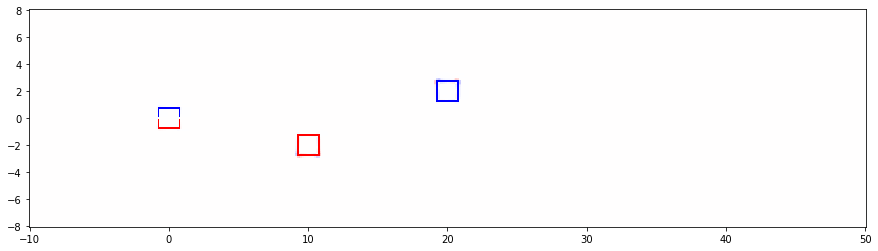

25000


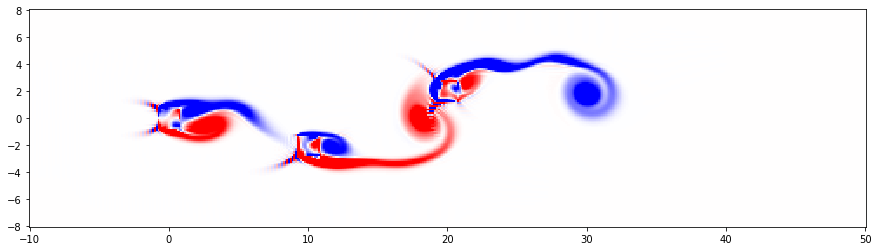

50000


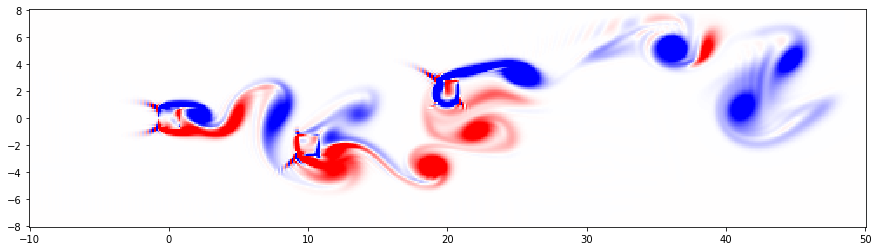

75000


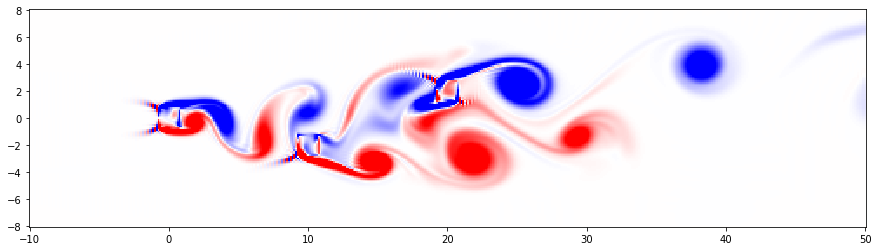

100000


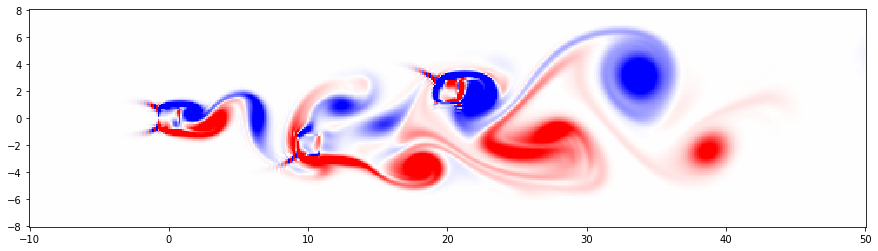

125000


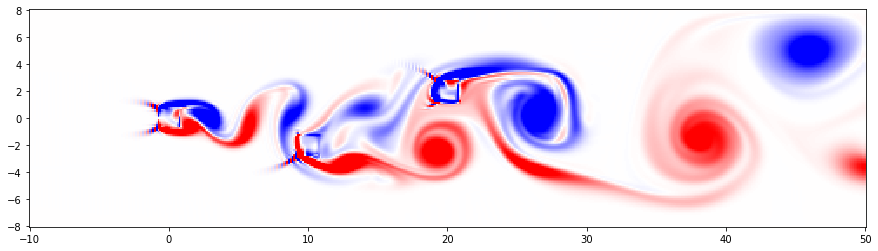

150000


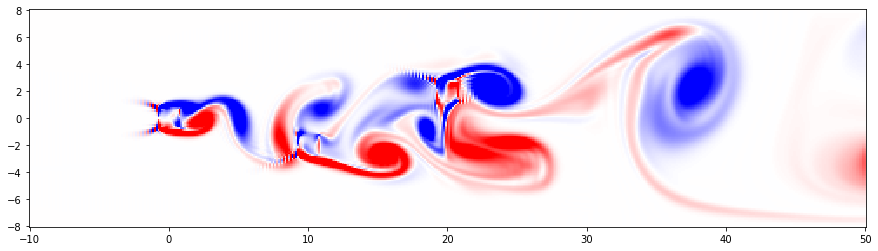

175000


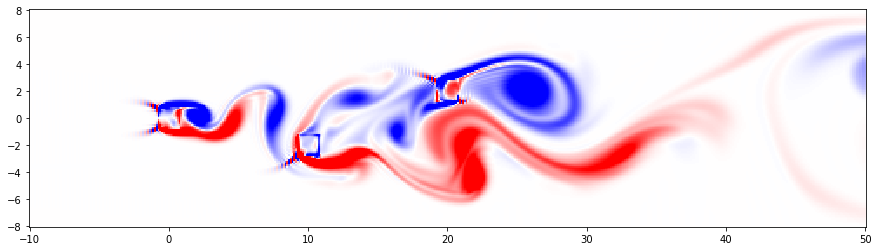

200000


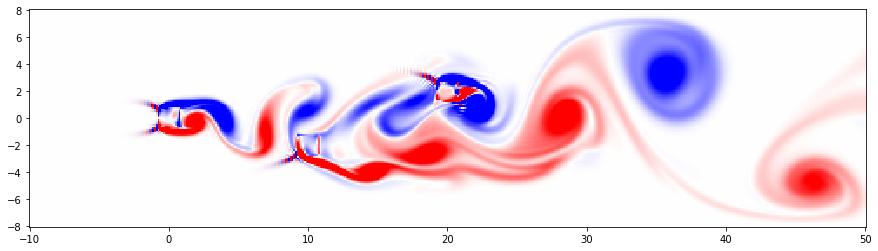

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\3122642289.py:167: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\3122642289.py:168: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


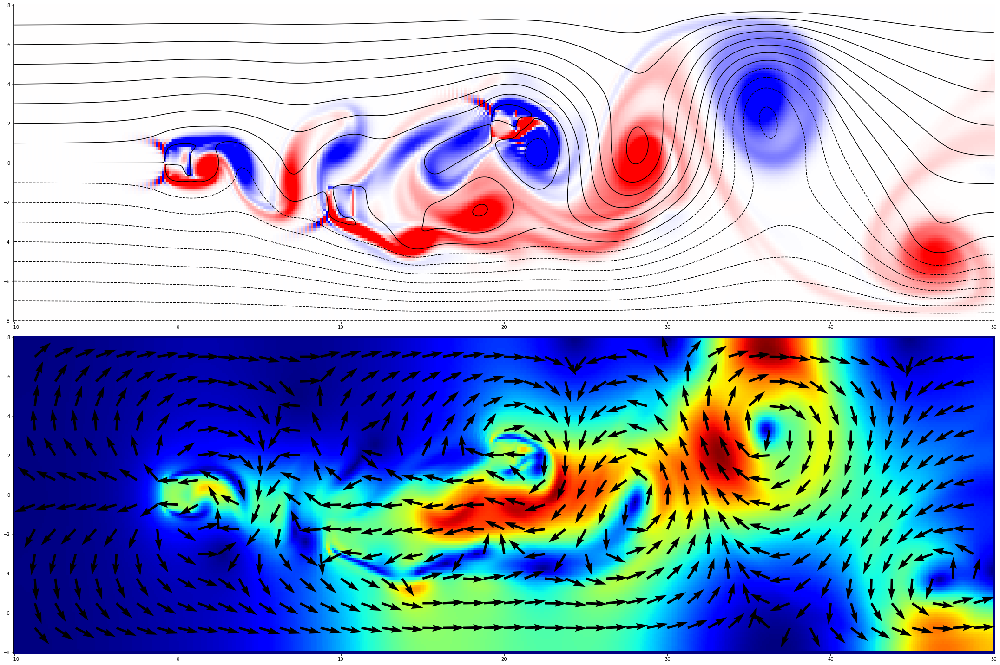

In [14]:
re=150
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

nx3=int(nx/3)
ny3=int(3*ny/8)

nx4=int(nx/2)
ny4=int(5*ny/8)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3-obs2]=0.
        om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3+obs2]=0.
        om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4-obs2]=0.
        om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx4-obs2-2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4+obs2]=0.
        om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx4+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny3-obs2,nx3+j-obs1]=0.
        om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny3+obs2,nx3+j-obs1]=0.
        om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny4-obs2,nx4+j-obs1]=0.
        om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny4+obs2,nx4+j-obs1]=0.
        om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3-obs2]=0.
    om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3-obs2]=0.
    om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3+obs2]=0.
    om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3+obs2]=0.
    om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4-obs2]=0.
    om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4-obs2]=0.
    om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4+obs2]=0.
    om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4+obs2]=0.
    om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)  

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

0


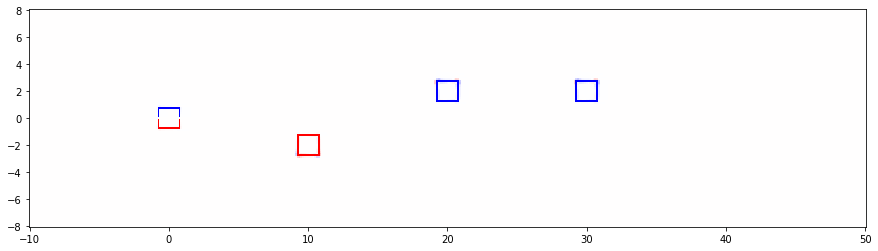

25000


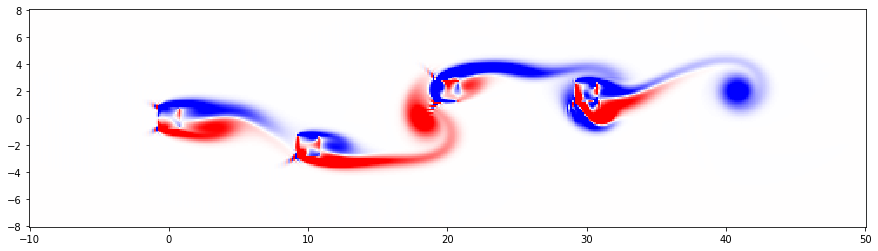

50000


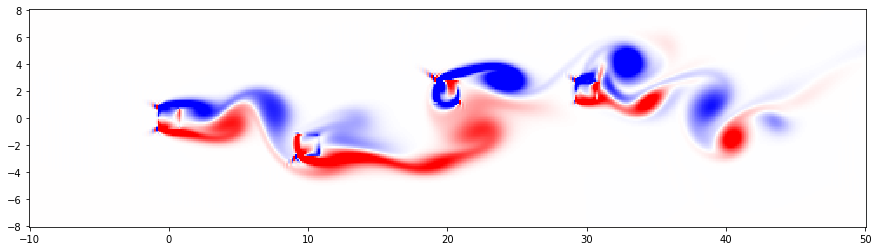

75000


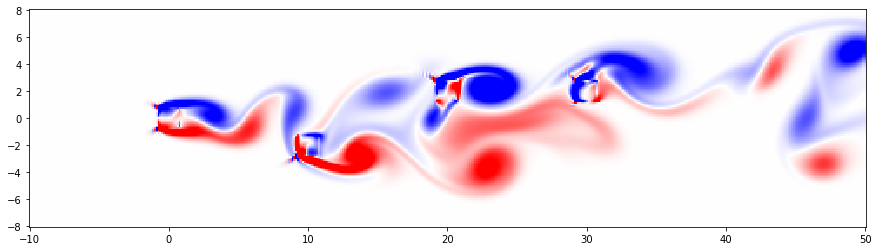

100000


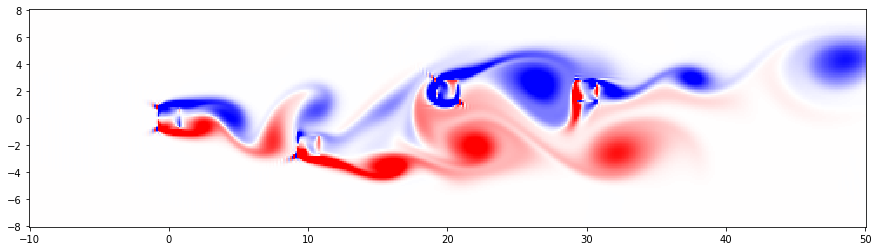

125000


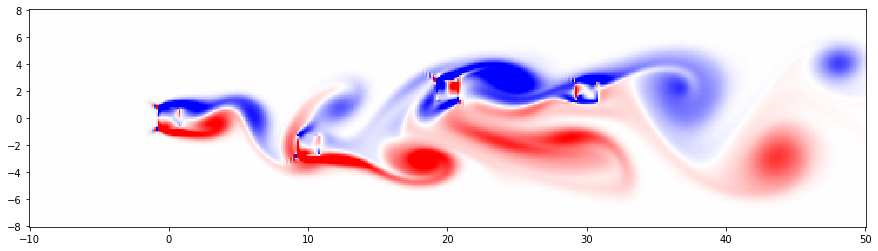

150000


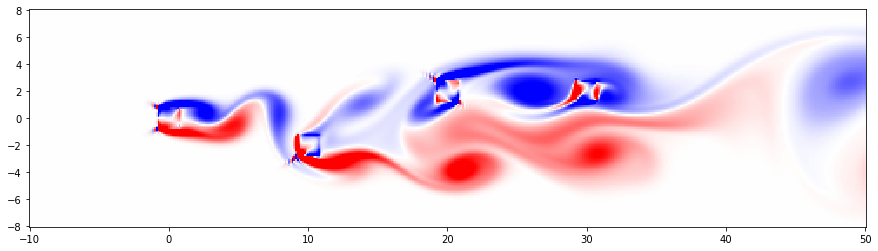

175000


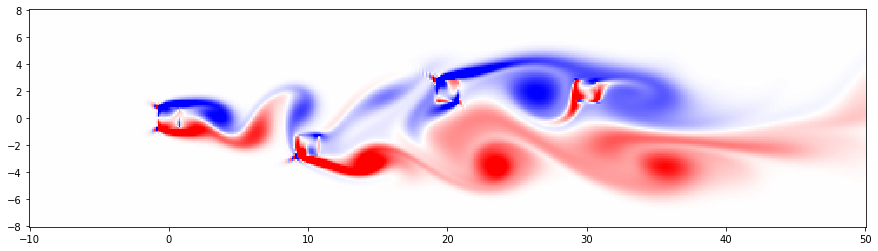

200000


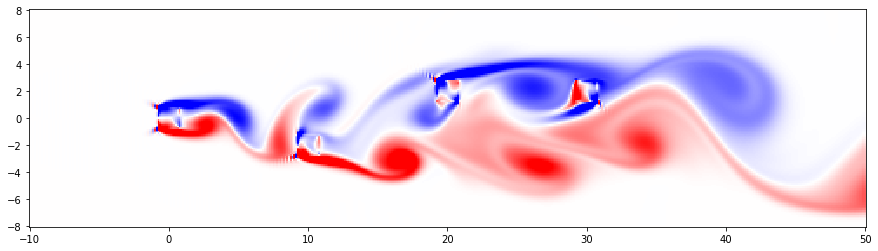

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\955034220.py:187: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\955034220.py:188: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


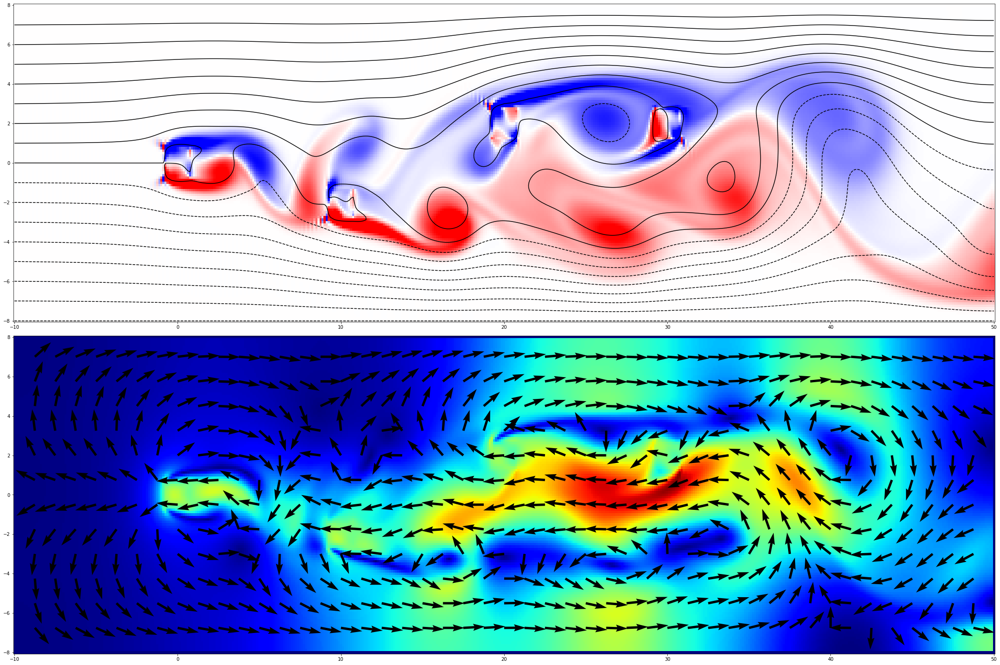

In [15]:
re=75
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

nx3=int(nx/3)
ny3=int(3*ny/8)

nx4=int(nx/2)
ny4=int(5*ny/8)

nx5=int(2*nx/3)
ny5=int(5*ny/8)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3-obs2]=0.
        om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3+obs2]=0.
        om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4-obs2]=0.
        om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx4-obs2-2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4+obs2]=0.
        om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx4+obs2+2]*(idx*idx*0.25)
        sf[ny5+i-obs1,nx5-obs2]=0.
        om[ny5+i-obs1,nx5-obs2]=-2.0*sf[ny5+i-obs1,nx5-obs2-2]*(idx*idx*0.25)
        sf[ny5+i-obs1,nx5+obs2]=0.
        om[ny5+i-obs1,nx5+obs2]=-2.0*sf[ny5+i-obs1,nx5+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny3-obs2,nx3+j-obs1]=0.
        om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny3+obs2,nx3+j-obs1]=0.
        om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny4-obs2,nx4+j-obs1]=0.
        om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny4+obs2,nx4+j-obs1]=0.
        om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny5-obs2,nx5+j-obs1]=0.
        om[ny5-obs2,nx5+j-obs1]=-2.0*sf[ny5-obs2-2,nx5+j-obs1]*(idy*idy*0.25)
        sf[ny5+obs2,nx5+j-obs1]=0.
        om[ny5+obs2,nx5+j-obs1]=-2.0*sf[ny5+obs2+2,nx5+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3-obs2]=0.
    om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3-obs2]=0.
    om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3+obs2]=0.
    om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3+obs2]=0.
    om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4-obs2]=0.
    om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4-obs2]=0.
    om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4+obs2]=0.
    om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4+obs2]=0.
    om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny5-obs2,nx5-obs2]=0.
    om[ny5-obs2,nx5-obs2]=-2.0*sf[ny5-obs2-2,nx5-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny5+obs2,nx5-obs2]=0.
    om[ny5+obs2,nx5-obs2]=-2.0*sf[ny5+obs2+2,nx5-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny5+obs2,nx5+obs2]=0.
    om[ny5+obs2,nx5+obs2]=-2.0*sf[ny5+obs2+2,nx5+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny5-obs2,nx5+obs2]=0.
    om[ny5-obs2,nx5+obs2]=-2.0*sf[ny5-obs2-2,nx5+obs2+2]/(4*dy*dy+4*dx*dx)
    
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)  

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

0


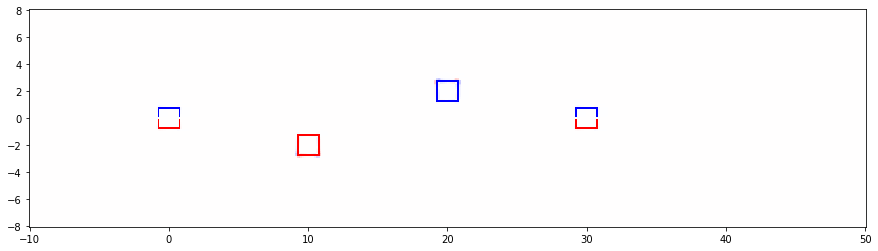

25000


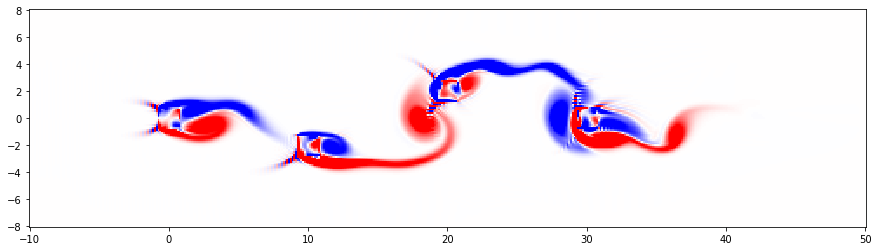

50000


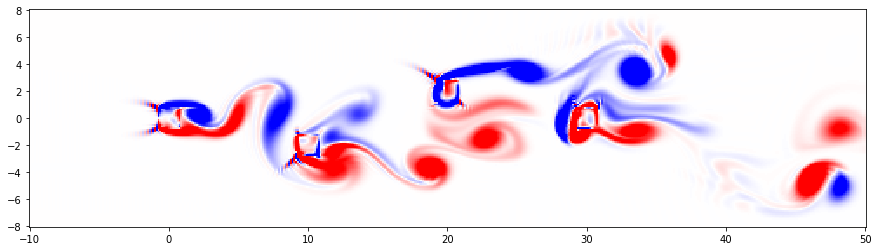

75000


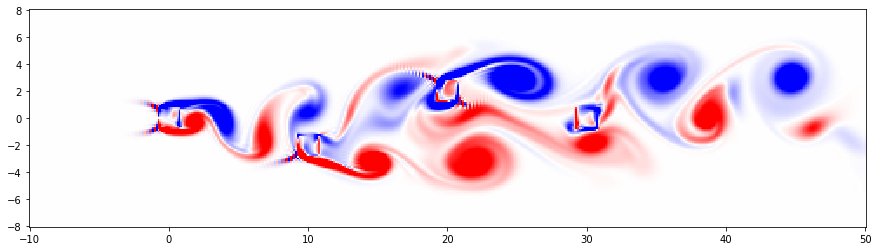

100000


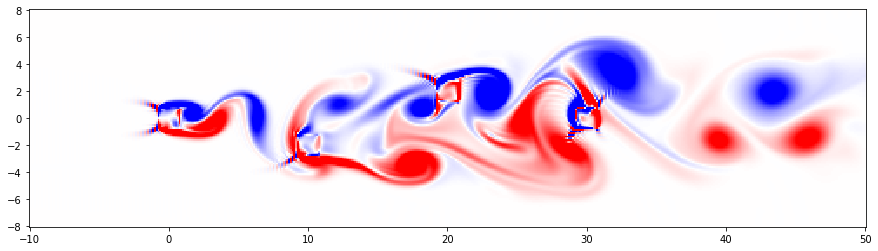

125000


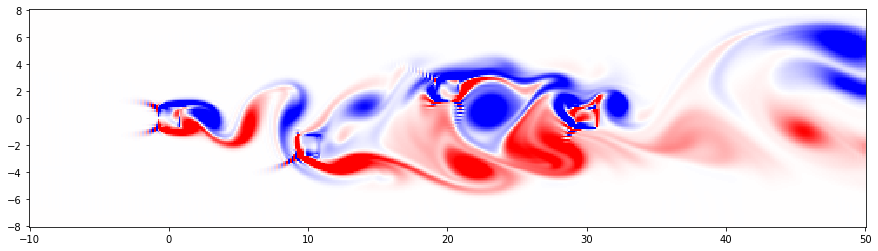

150000


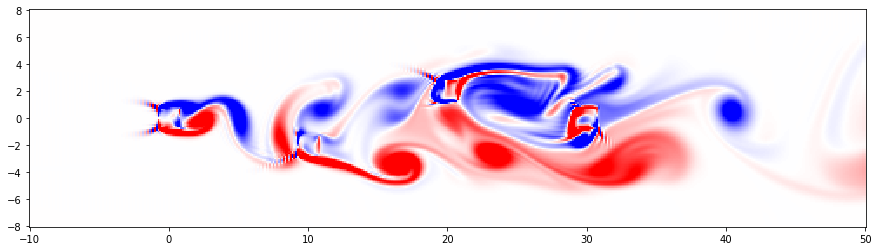

175000


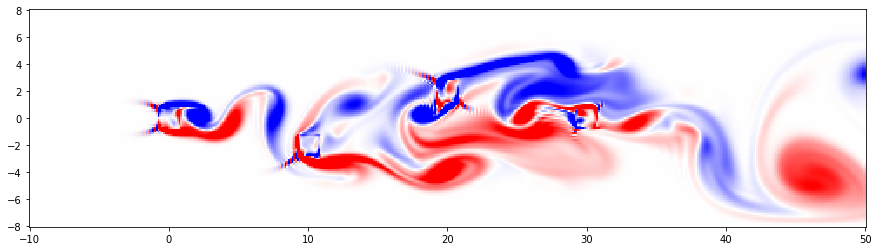

200000


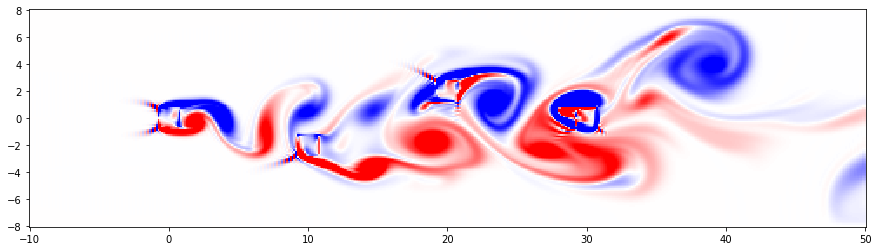

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\4171651001.py:187: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\4171651001.py:188: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


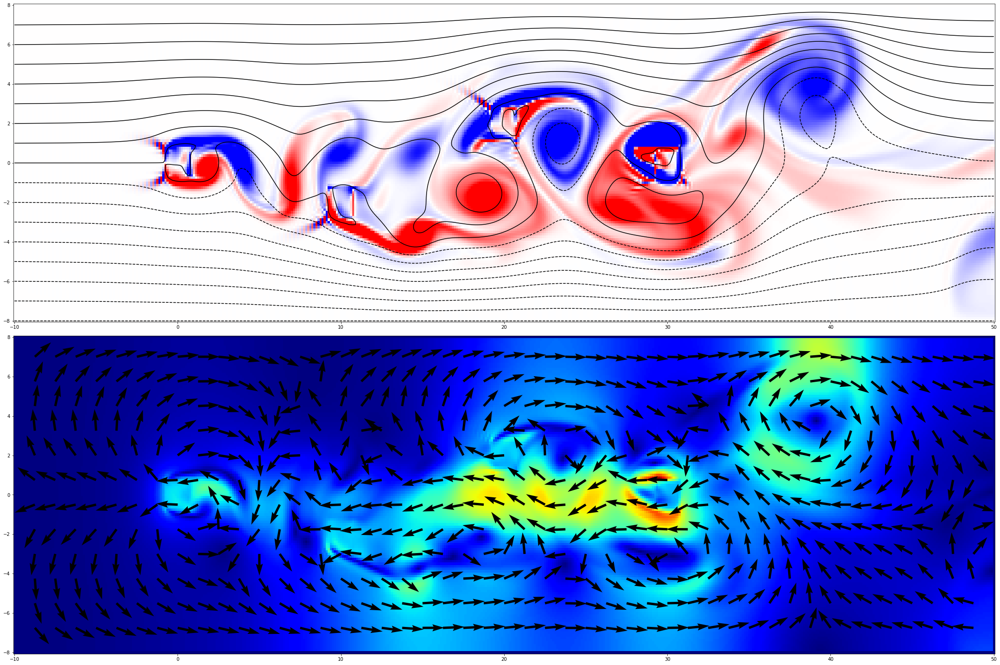

In [16]:
re=150
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

nx3=int(nx/3)
ny3=int(3*ny/8)

nx4=int(nx/2)
ny4=int(5*ny/8)

nx5=int(2*nx/3)
ny5=int(ny/2)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3-obs2]=0.
        om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3+obs2]=0.
        om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4-obs2]=0.
        om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx4-obs2-2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4+obs2]=0.
        om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx4+obs2+2]*(idx*idx*0.25)
        sf[ny5+i-obs1,nx5-obs2]=0.
        om[ny5+i-obs1,nx5-obs2]=-2.0*sf[ny5+i-obs1,nx5-obs2-2]*(idx*idx*0.25)
        sf[ny5+i-obs1,nx5+obs2]=0.
        om[ny5+i-obs1,nx5+obs2]=-2.0*sf[ny5+i-obs1,nx5+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny3-obs2,nx3+j-obs1]=0.
        om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny3+obs2,nx3+j-obs1]=0.
        om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny4-obs2,nx4+j-obs1]=0.
        om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny4+obs2,nx4+j-obs1]=0.
        om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny5-obs2,nx5+j-obs1]=0.
        om[ny5-obs2,nx5+j-obs1]=-2.0*sf[ny5-obs2-2,nx5+j-obs1]*(idy*idy*0.25)
        sf[ny5+obs2,nx5+j-obs1]=0.
        om[ny5+obs2,nx5+j-obs1]=-2.0*sf[ny5+obs2+2,nx5+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3-obs2]=0.
    om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3-obs2]=0.
    om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3+obs2]=0.
    om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3+obs2]=0.
    om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4-obs2]=0.
    om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4-obs2]=0.
    om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4+obs2]=0.
    om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4+obs2]=0.
    om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny5-obs2,nx5-obs2]=0.
    om[ny5-obs2,nx5-obs2]=-2.0*sf[ny5-obs2-2,nx5-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny5+obs2,nx5-obs2]=0.
    om[ny5+obs2,nx5-obs2]=-2.0*sf[ny5+obs2+2,nx5-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny5+obs2,nx5+obs2]=0.
    om[ny5+obs2,nx5+obs2]=-2.0*sf[ny5+obs2+2,nx5+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny5-obs2,nx5+obs2]=0.
    om[ny5-obs2,nx5+obs2]=-2.0*sf[ny5-obs2-2,nx5+obs2+2]/(4*dy*dy+4*dx*dx)
    
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)  

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

0


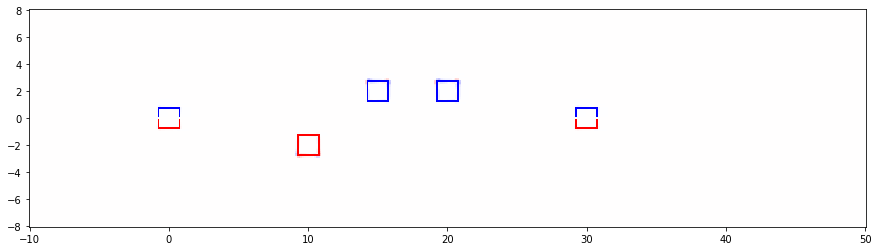

25000


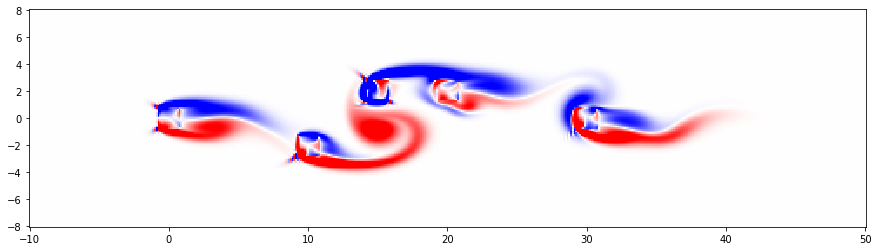

50000


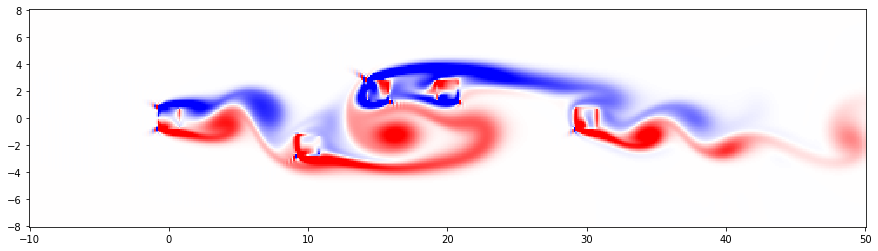

75000


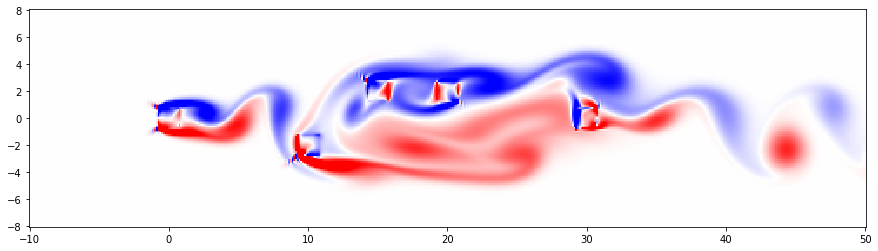

100000


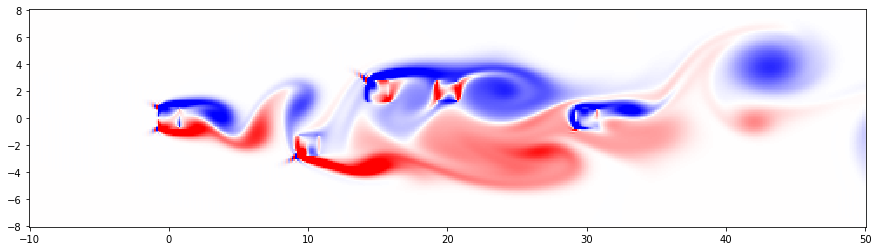

125000


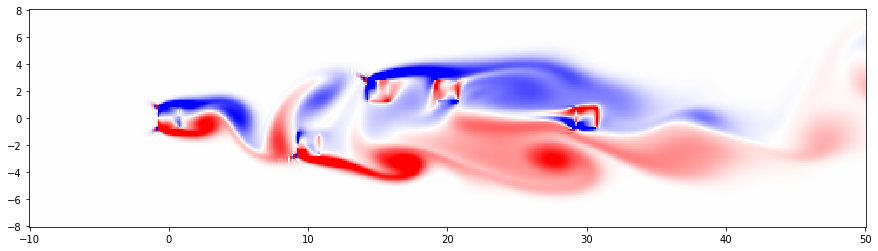

150000


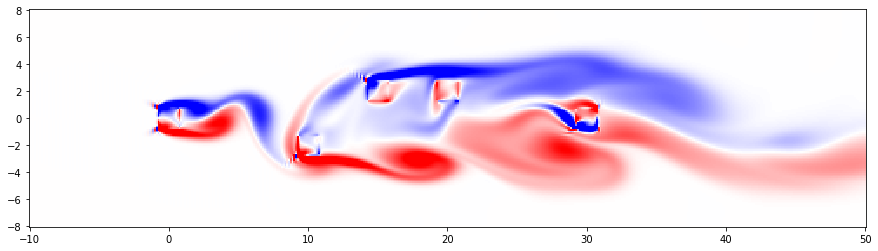

175000


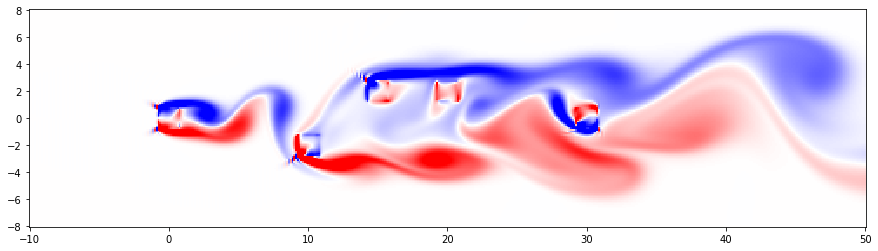

200000


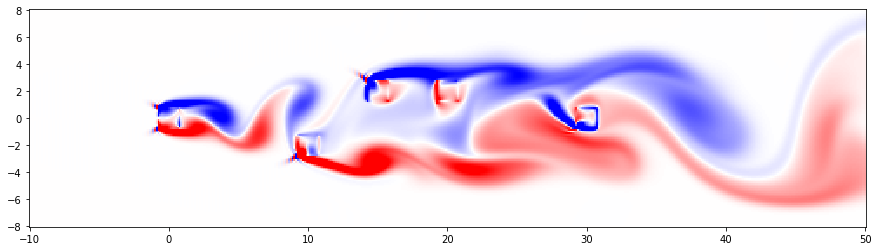

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\986565256.py:206: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\986565256.py:207: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


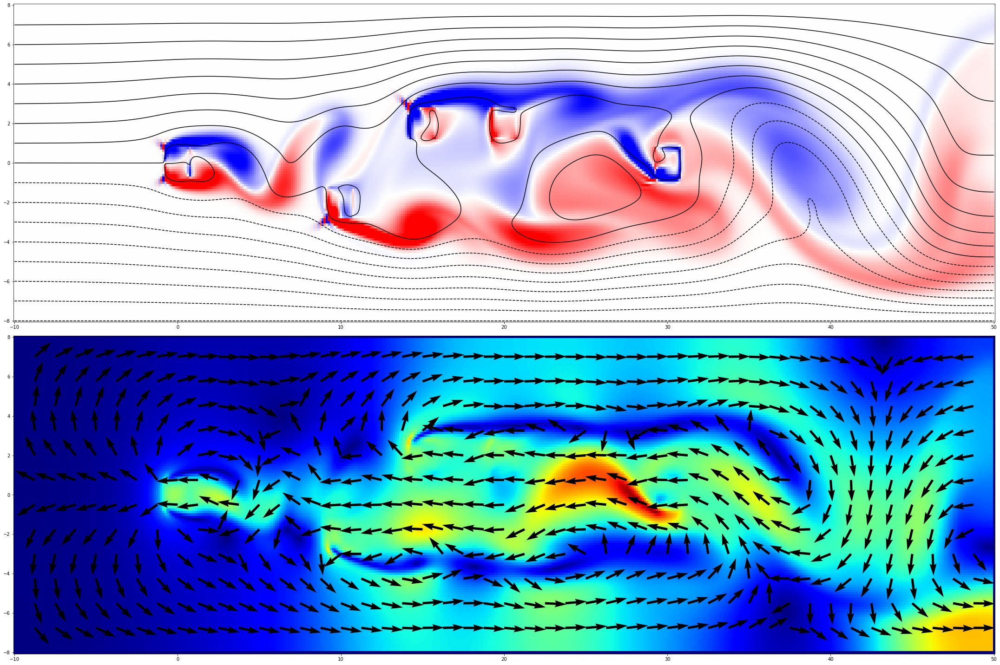

In [17]:
re=75
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

nx3=int(nx/3)
ny3=int(3*ny/8)

nx4=int(nx/2)
ny4=int(5*ny/8)

nx5=int(2*nx/3)
ny5=int(ny/2)

nx6=int(5*nx/12)
ny6=int(5*ny/8)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3-obs2]=0.
        om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3+obs2]=0.
        om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4-obs2]=0.
        om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx4-obs2-2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4+obs2]=0.
        om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx4+obs2+2]*(idx*idx*0.25)
        sf[ny5+i-obs1,nx5-obs2]=0.
        om[ny5+i-obs1,nx5-obs2]=-2.0*sf[ny5+i-obs1,nx5-obs2-2]*(idx*idx*0.25)
        sf[ny5+i-obs1,nx5+obs2]=0.
        om[ny5+i-obs1,nx5+obs2]=-2.0*sf[ny5+i-obs1,nx5+obs2+2]*(idx*idx*0.25)
        sf[ny6+i-obs1,nx6-obs2]=0.
        om[ny6+i-obs1,nx6-obs2]=-2.0*sf[ny6+i-obs1,nx6-obs2-2]*(idx*idx*0.25)
        sf[ny6+i-obs1,nx6+obs2]=0.
        om[ny6+i-obs1,nx6+obs2]=-2.0*sf[ny6+i-obs1,nx6+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny3-obs2,nx3+j-obs1]=0.
        om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny3+obs2,nx3+j-obs1]=0.
        om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny4-obs2,nx4+j-obs1]=0.
        om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny4+obs2,nx4+j-obs1]=0.
        om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny5-obs2,nx5+j-obs1]=0.
        om[ny5-obs2,nx5+j-obs1]=-2.0*sf[ny5-obs2-2,nx5+j-obs1]*(idy*idy*0.25)
        sf[ny5+obs2,nx5+j-obs1]=0.
        om[ny5+obs2,nx5+j-obs1]=-2.0*sf[ny5+obs2+2,nx5+j-obs1]*(idy*idy*0.25)
        sf[ny6-obs2,nx6+j-obs1]=0.
        om[ny6-obs2,nx6+j-obs1]=-2.0*sf[ny6-obs2-2,nx6+j-obs1]*(idy*idy*0.25)
        sf[ny6+obs2,nx6+j-obs1]=0.
        om[ny6+obs2,nx6+j-obs1]=-2.0*sf[ny6+obs2+2,nx6+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3-obs2]=0.
    om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3-obs2]=0.
    om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3+obs2]=0.
    om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3+obs2]=0.
    om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4-obs2]=0.
    om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4-obs2]=0.
    om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4+obs2]=0.
    om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4+obs2]=0.
    om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny5-obs2,nx5-obs2]=0.
    om[ny5-obs2,nx5-obs2]=-2.0*sf[ny5-obs2-2,nx5-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny5+obs2,nx5-obs2]=0.
    om[ny5+obs2,nx5-obs2]=-2.0*sf[ny5+obs2+2,nx5-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny5+obs2,nx5+obs2]=0.
    om[ny5+obs2,nx5+obs2]=-2.0*sf[ny5+obs2+2,nx5+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny5-obs2,nx5+obs2]=0.
    om[ny5-obs2,nx5+obs2]=-2.0*sf[ny5-obs2-2,nx5+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny6-obs2,nx6-obs2]=0.
    om[ny6-obs2,nx6-obs2]=-2.0*sf[ny6-obs2-2,nx6-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny6+obs2,nx6-obs2]=0.
    om[ny6+obs2,nx6-obs2]=-2.0*sf[ny6+obs2+2,nx6-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny6+obs2,nx6+obs2]=0.
    om[ny6+obs2,nx6+obs2]=-2.0*sf[ny6+obs2+2,nx6+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny6-obs2,nx6+obs2]=0.
    om[ny6-obs2,nx6+obs2]=-2.0*sf[ny6-obs2-2,nx6+obs2+2]/(4*dy*dy+4*dx*dx)
    
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)  

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

0


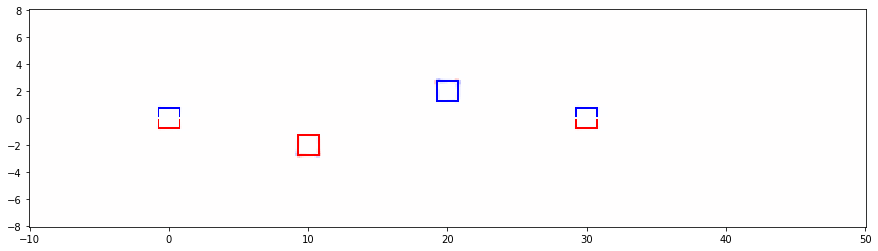

25000


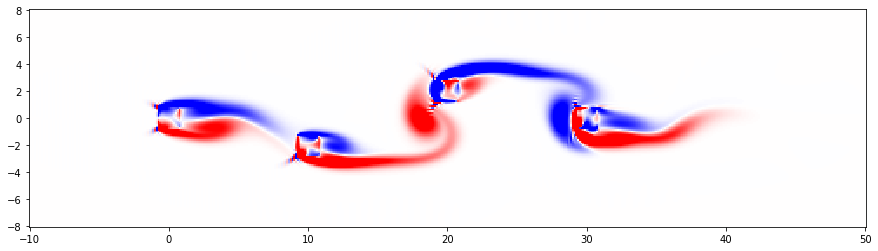

50000


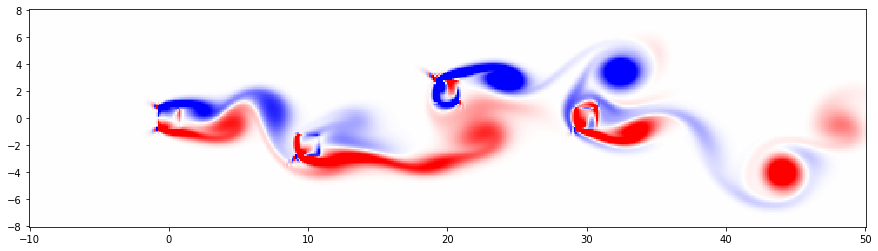

75000


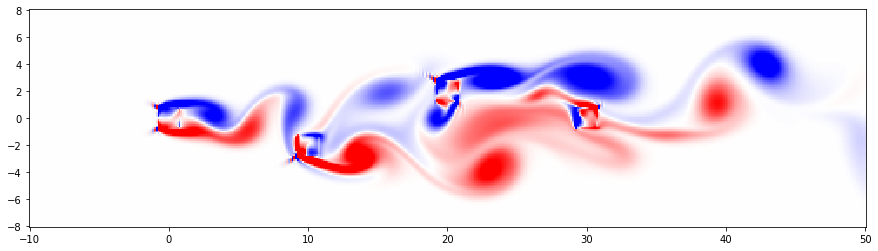

100000


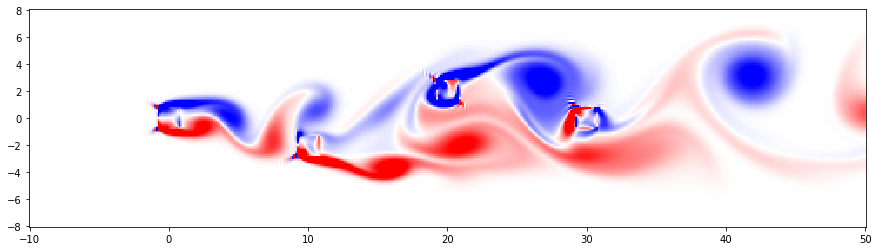

125000


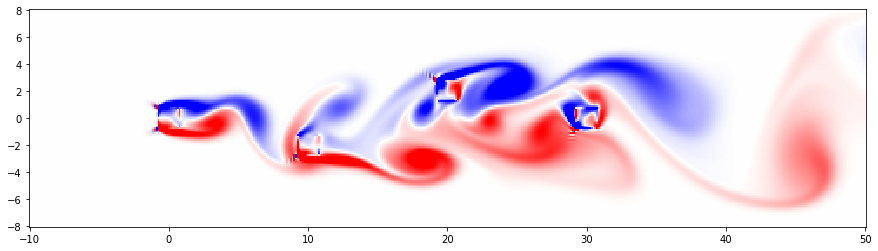

150000


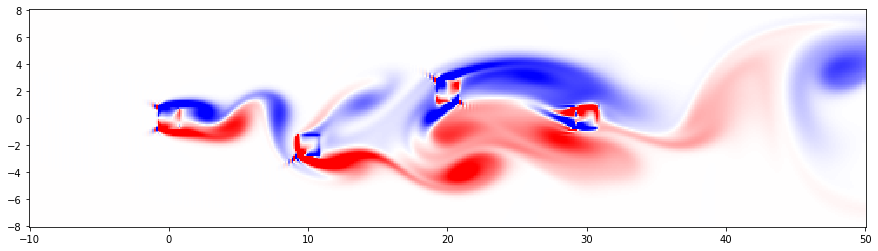

175000


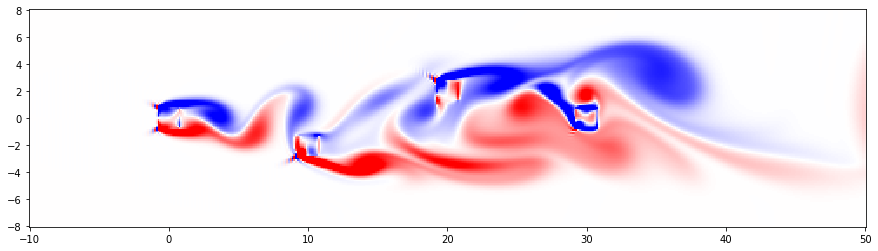

200000


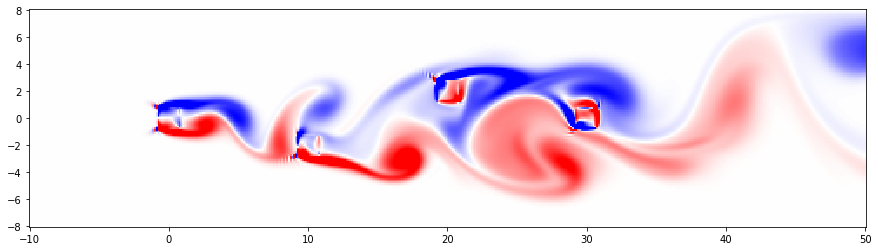

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\1599964939.py:187: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\1599964939.py:188: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


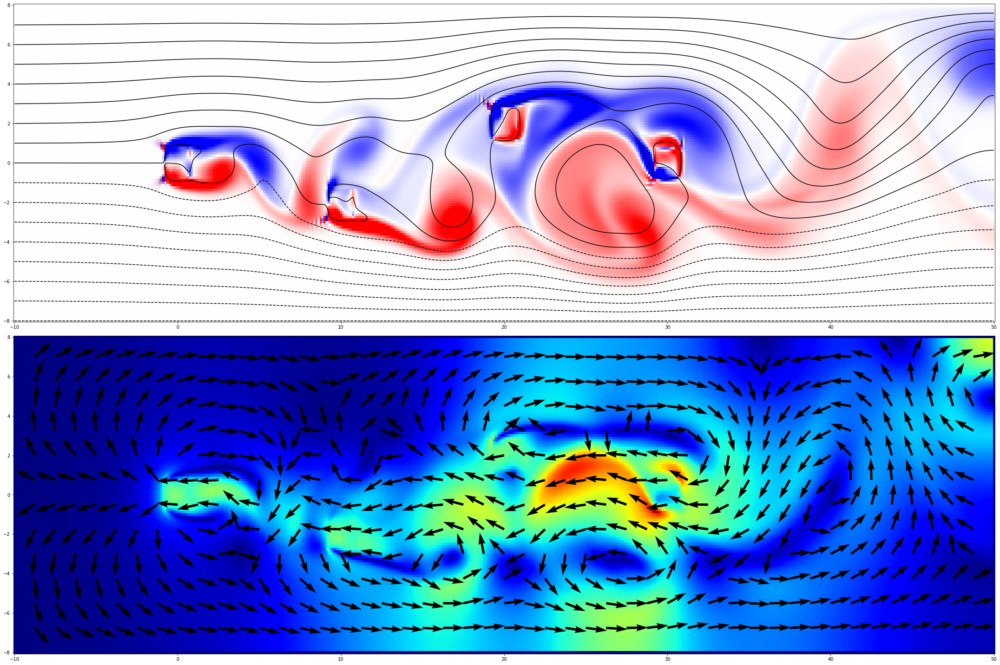

In [20]:
re=75
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

nx3=int(nx/3)
ny3=int(3*ny/8)

nx4=int(nx/2)
ny4=int(5*ny/8)

nx5=int(2*nx/3)
ny5=int(ny/2)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3-obs2]=0.
        om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3+obs2]=0.
        om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4-obs2]=0.
        om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx4-obs2-2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4+obs2]=0.
        om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx4+obs2+2]*(idx*idx*0.25)
        sf[ny5+i-obs1,nx5-obs2]=0.
        om[ny5+i-obs1,nx5-obs2]=-2.0*sf[ny5+i-obs1,nx5-obs2-2]*(idx*idx*0.25)
        sf[ny5+i-obs1,nx5+obs2]=0.
        om[ny5+i-obs1,nx5+obs2]=-2.0*sf[ny5+i-obs1,nx5+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny3-obs2,nx3+j-obs1]=0.
        om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny3+obs2,nx3+j-obs1]=0.
        om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny4-obs2,nx4+j-obs1]=0.
        om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny4+obs2,nx4+j-obs1]=0.
        om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny5-obs2,nx5+j-obs1]=0.
        om[ny5-obs2,nx5+j-obs1]=-2.0*sf[ny5-obs2-2,nx5+j-obs1]*(idy*idy*0.25)
        sf[ny5+obs2,nx5+j-obs1]=0.
        om[ny5+obs2,nx5+j-obs1]=-2.0*sf[ny5+obs2+2,nx5+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3-obs2]=0.
    om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3-obs2]=0.
    om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3+obs2]=0.
    om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3+obs2]=0.
    om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4-obs2]=0.
    om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4-obs2]=0.
    om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4+obs2]=0.
    om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4+obs2]=0.
    om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny5-obs2,nx5-obs2]=0.
    om[ny5-obs2,nx5-obs2]=-2.0*sf[ny5-obs2-2,nx5-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny5+obs2,nx5-obs2]=0.
    om[ny5+obs2,nx5-obs2]=-2.0*sf[ny5+obs2+2,nx5-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny5+obs2,nx5+obs2]=0.
    om[ny5+obs2,nx5+obs2]=-2.0*sf[ny5+obs2+2,nx5+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny5-obs2,nx5+obs2]=0.
    om[ny5-obs2,nx5+obs2]=-2.0*sf[ny5-obs2-2,nx5+obs2+2]/(4*dy*dy+4*dx*dx)
    
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)  

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

0


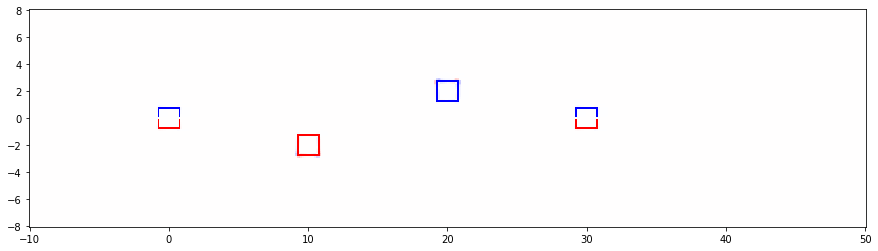

25000


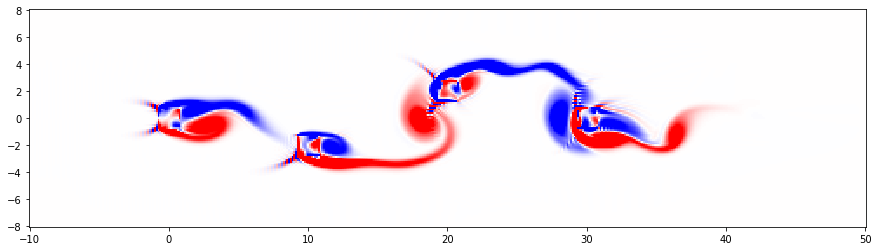

50000


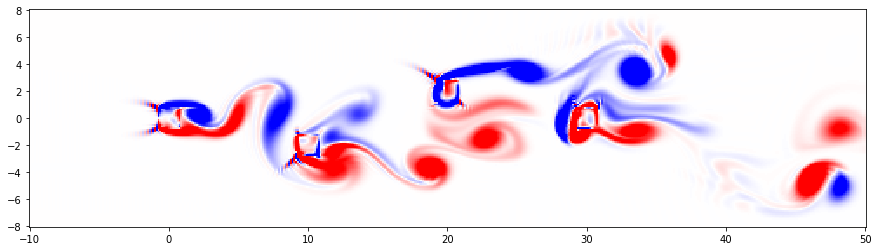

75000


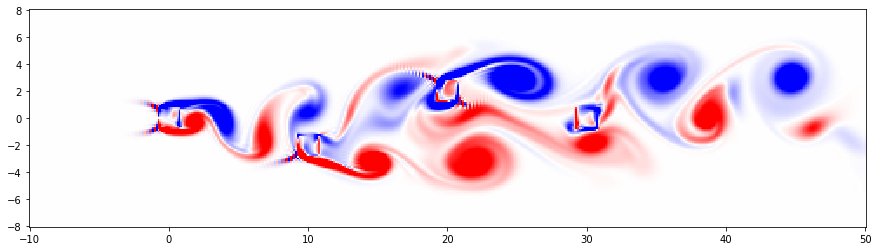

100000


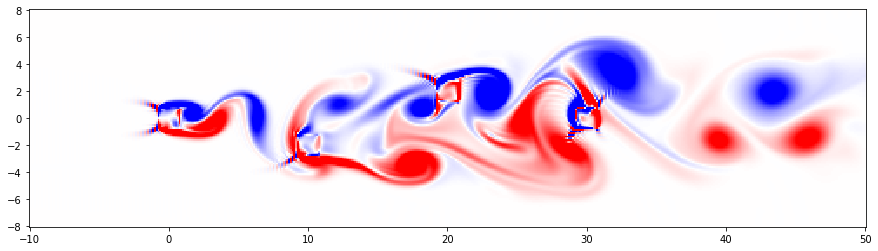

125000


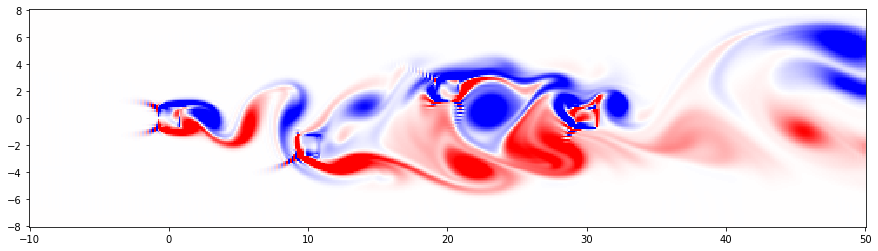

150000


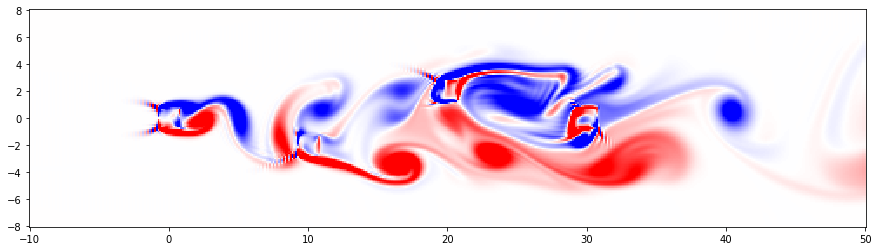

175000


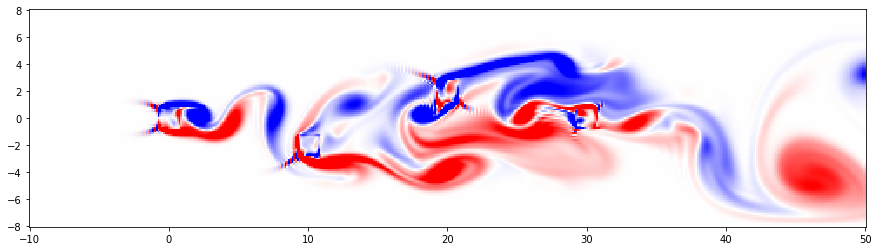

200000


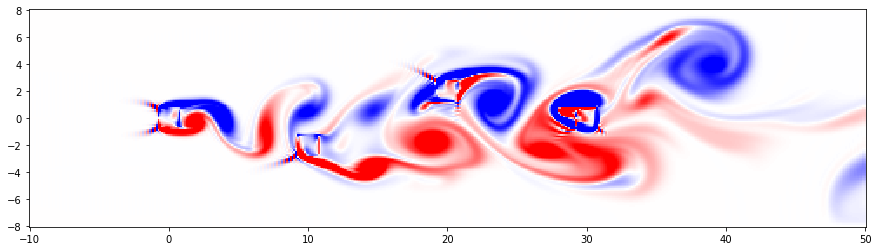

C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\4171651001.py:187: RuntimeWarning: invalid value encountered in true_divide
  u=u/abs_u
C:\Users\kouki\AppData\Local\Temp\ipykernel_10912\4171651001.py:188: RuntimeWarning: invalid value encountered in true_divide
  v=v/abs_u


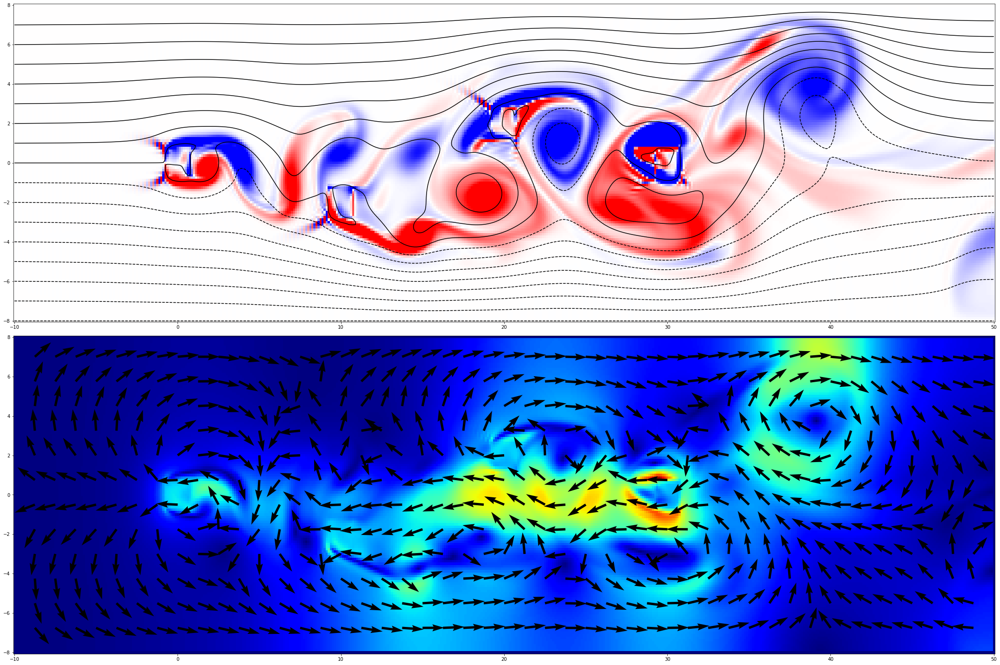

In [21]:
re=150
rrr=str(int(re)).zfill(3)
dt=np.float64(0.0005)

X0,X1,dx=-10,50.1,0.125
Y0,Y1,dy=-8,8.1,0.125
x=np.arange(X0,X1,dx)
y=np.arange(Y0,Y1,dy)
x,y=np.meshgrid(x,y)

nx=x.shape[1]
ny=x.shape[0]
sf=np.zeros([ny,nx])
sf0=np.zeros([ny,nx])
om=np.zeros([ny,nx])
u=np.zeros([ny,nx])
v=np.zeros([ny,nx])
abs_u=np.zeros([ny,nx])

#print(x,y)

idx=np.float64(1./dx)
idy=np.float64(1./dy)
ire=np.float64(1./re)

U=1.0

for i in range(ny):
    for j in range(nx):
        sf[i,j]=U*y[i,j]
        sf0[i,j]=sf[i,j]
        om[i,j]=0.

nx2=int(nx/6)
ny2=int(ny/2)

nx3=int(nx/3)
ny3=int(3*ny/8)

nx4=int(nx/2)
ny4=int(5*ny/8)

nx5=int(2*nx/3)
ny5=int(ny/2)

#print(nx2,ny2)

loop_max=10

for k in range(200001):

#    for j in range(nx):
#        sf[0,j]=sf[1,j]
#        sf[ny-1,j]=sf[ny-1,j]

    for i in range(ny):
        sf[i,0]=U*y[i,j]
        sf[i,nx-1]=sf[i,nx-2]

#    for j in range(nx):
#        om[0,j]=om[1,j]
#        om[ny-1,j]=om[ny-1,j]

    for i in range(ny):
        om[i,0]=0.
        om[i,nx-1]=om[i,nx-2]
    
    obs=11
    obs1=int(obs*0.5)
    obs2=int((obs+1)*0.5)
    for i in range(obs):
        sf[ny2+i-obs1,nx2-obs2]=0.
        om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
        sf[ny2+i-obs1,nx2+obs2]=0.
        om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3-obs2]=0.
        om[ny3+i-obs1,nx3-obs2]=-2.0*sf[ny3+i-obs1,nx3-obs2-2]*(idx*idx*0.25)
        sf[ny3+i-obs1,nx3+obs2]=0.
        om[ny3+i-obs1,nx3+obs2]=-2.0*sf[ny3+i-obs1,nx3+obs2+2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4-obs2]=0.
        om[ny4+i-obs1,nx4-obs2]=-2.0*sf[ny4+i-obs1,nx4-obs2-2]*(idx*idx*0.25)
        sf[ny4+i-obs1,nx4+obs2]=0.
        om[ny4+i-obs1,nx4+obs2]=-2.0*sf[ny4+i-obs1,nx4+obs2+2]*(idx*idx*0.25)
        sf[ny5+i-obs1,nx5-obs2]=0.
        om[ny5+i-obs1,nx5-obs2]=-2.0*sf[ny5+i-obs1,nx5-obs2-2]*(idx*idx*0.25)
        sf[ny5+i-obs1,nx5+obs2]=0.
        om[ny5+i-obs1,nx5+obs2]=-2.0*sf[ny5+i-obs1,nx5+obs2+2]*(idx*idx*0.25)


    for j in range(obs):
        sf[ny2-obs2,nx2+j-obs1]=0.
        om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny2+obs2,nx2+j-obs1]=0.
        om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
        sf[ny3-obs2,nx3+j-obs1]=0.
        om[ny3-obs2,nx3+j-obs1]=-2.0*sf[ny3-obs2-2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny3+obs2,nx3+j-obs1]=0.
        om[ny3+obs2,nx3+j-obs1]=-2.0*sf[ny3+obs2+2,nx3+j-obs1]*(idy*idy*0.25)
        sf[ny4-obs2,nx4+j-obs1]=0.
        om[ny4-obs2,nx4+j-obs1]=-2.0*sf[ny4-obs2-2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny4+obs2,nx4+j-obs1]=0.
        om[ny4+obs2,nx4+j-obs1]=-2.0*sf[ny4+obs2+2,nx4+j-obs1]*(idy*idy*0.25)
        sf[ny5-obs2,nx5+j-obs1]=0.
        om[ny5-obs2,nx5+j-obs1]=-2.0*sf[ny5-obs2-2,nx5+j-obs1]*(idy*idy*0.25)
        sf[ny5+obs2,nx5+j-obs1]=0.
        om[ny5+obs2,nx5+j-obs1]=-2.0*sf[ny5+obs2+2,nx5+j-obs1]*(idy*idy*0.25)
        


    sf[ny2-obs2,nx2-obs2]=0.
    om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2-obs2]=0.
    om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny2+obs2,nx2+obs2]=0.
    om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny2-obs2,nx2+obs2]=0.
    om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3-obs2]=0.
    om[ny3-obs2,nx3-obs2]=-2.0*sf[ny3-obs2-2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3-obs2]=0.
    om[ny3+obs2,nx3-obs2]=-2.0*sf[ny3+obs2+2,nx3-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny3+obs2,nx3+obs2]=0.
    om[ny3+obs2,nx3+obs2]=-2.0*sf[ny3+obs2+2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny3-obs2,nx3+obs2]=0.
    om[ny3-obs2,nx3+obs2]=-2.0*sf[ny3-obs2-2,nx3+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4-obs2]=0.
    om[ny4-obs2,nx4-obs2]=-2.0*sf[ny4-obs2-2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4-obs2]=0.
    om[ny4+obs2,nx4-obs2]=-2.0*sf[ny4+obs2+2,nx4-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny4+obs2,nx4+obs2]=0.
    om[ny4+obs2,nx4+obs2]=-2.0*sf[ny4+obs2+2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny4-obs2,nx4+obs2]=0.
    om[ny4-obs2,nx4+obs2]=-2.0*sf[ny4-obs2-2,nx4+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny5-obs2,nx5-obs2]=0.
    om[ny5-obs2,nx5-obs2]=-2.0*sf[ny5-obs2-2,nx5-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny5+obs2,nx5-obs2]=0.
    om[ny5+obs2,nx5-obs2]=-2.0*sf[ny5+obs2+2,nx5-obs2-2]/(4*dy*dy+4*dx*dx)
    sf[ny5+obs2,nx5+obs2]=0.
    om[ny5+obs2,nx5+obs2]=-2.0*sf[ny5+obs2+2,nx5+obs2+2]/(4*dy*dy+4*dx*dx)
    sf[ny5-obs2,nx5+obs2]=0.
    om[ny5-obs2,nx5+obs2]=-2.0*sf[ny5-obs2-2,nx5+obs2+2]/(4*dy*dy+4*dx*dx)
    
    

#    for i in range(obs-2):
#        for j in range(obs-2):
#            sf[ny2+i-obs1+1,nx2+j-obs1+1]=0.
#            om[ny2+i-obs1+1,nx2+j-obs1+1]=0.
    
    loop=0
    while (loop<loop_max):
        sf=cal_sf(nx,ny,idx,idy,sf,om)
#        for i in range(1,ny-1):
#            for j in range(1,nx-1):
#                sf[i,j]=(0.5/(idx*idx+idy*idy))*((idy*idy)*(sf[i-1,j]+sf[i+1,j])+(idx*idx)*(sf[i,j-1]+sf[i,j+1])+om[i,j])
        loop=loop+1
    
    om=cal_om(nx,ny,idx,idy,dt,ire,sf,om)

#    for i in range(1,ny-1):
#        for j in range(1,nx-1):
#            p1=(0.5*idx)*(sf[i,j+1]-sf[i,j-1])*(0.5*idy)*(om[i+1,j]-om[i-1,j])
#            p2=(0.5*idy)*(sf[i+1,j]-sf[i-1,j])*(0.5*idx)*(om[i,j+1]-om[i,j-1]) 
#            p3=(idx*idx)*(om[i,j+1]-2.*om[i,j]+om[i,j-1])+(idy*idy)*(om[i+1,j]-2.*om[i,j]+om[i-1,j])
#            om[i,j]=om[i,j]+dt*(p1-p2+ire*p3)
    
    if k%25000 == 0:
        print(k)
        plt.figure(figsize=(15,4))
        plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
        sss=str(k).zfill(6)    
        out_img='img/v_'+sss+'.png'
        #plt.savefig(out_img)
        plt.show()
        plt.close()
#        out_sf='RE'+rrr+'/sf_'+sss
#        np.save(out_sf,sf)
#        out_om='RE'+rrr+'/om_'+sss
#        np.save(out_om,om)  

for i in range(1,ny-1):
    for j in range(1,nx-1):
        u[i,j]=(sf[i+1,j]-sf[i-1,j])/(2*dy)-U
        v[i,j]=-(sf[i,j+1]-sf[i,j-1])/(2*dx)

abs_u=np.sqrt(u*u+v*v)
u=u/abs_u
v=v/abs_u

s=np.arange(Y0*U,Y1*U,1.0)
plt.figure(figsize=(30,20),tight_layout=True)
plt.subplot(2,1,1)
plt.pcolormesh(x,y,om,shading='auto',cmap='bwr',vmin=-1.5,vmax=1.5)
plt.contour(x,y,sf,levels=s,colors='k')
plt.subplot(2,1,2)
plt.pcolormesh(x,y,abs_u,shading='auto',cmap='jet')
hh=10
plt.quiver(x[::hh,::hh],y[::hh,::hh],u[::hh,::hh],v[::hh,::hh])

out_img='exq_RE'+rrr+'.png'
#plt.savefig(out_img)
plt.show()
plt.close()

円のプログラム

In [ ]:
obs=11
obs1=int(obs*0.5)
obs2=int((obs+1)*0.5)
for i in range(obs):
    sf[ny2+i-obs1,nx2-obs2]=0.
    om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
    sf[ny2+i-obs1,nx2+obs2]=0.
    om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
for j in range(obs):
    sf[ny2-obs2,nx2+j-obs1]=0.
    om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
    sf[ny2+obs2,nx2+j-obs1]=0.
    om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
sf[ny2-obs2,nx2-obs2]=0.
om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
sf[ny2+obs2,nx2-obs2]=0.
om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
sf[ny2+obs2,nx2+obs2]=0.
om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
sf[ny2-obs2,nx2+obs2]=0.
om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)



平板のプログラム

In [ ]:
obs=11
obs1=int(obs*0.5)
obs2=4
for i in range(obs):
    sf[ny2+i-obs1,nx2-obs2]=0.
    om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
    sf[ny2+i-obs1,nx2+obs2]=0.
    om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)

for j in range(obs2):
    sf[ny2-obs2,nx2+j-obs1]=0.
    om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
    sf[ny2+obs2,nx2+j-obs1]=0.
    om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)

In [ ]:
#境界条件の項(obsで板の縦の長さ,obs2で板の横の長さを変更できる)
obs=30
obs1=int(obs*0.5)
obs2=2

#y座標に関する境界条件
for i in range(obs):
    sf[ny2+i-obs1,nx2-obs2]=0.
    om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
    sf[ny2+i-obs1,nx2+obs2]=0.
    om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)

#x座標に関する境界条件
for j in range(obs2):
    sf[ny2-(obs1+1),nx2+j]=0.
    om[ny2-(obs1+1),nx2+j]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
    sf[ny2+(obs1+1),nx2+j]=0.
    om[ny2+(obs1+1),nx2+j]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)

半円のプログラム(右平板)

In [ ]:
obs=11
obs1=int(obs*0.5)
obs2=int((obs+1)*0.5)
for i in range(obs):
    sf[ny2+i-obs1,nx2-obs2]=0.
    om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
    sf[ny2+i-obs1,nx2+obs2]=0.
    om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
for j in range(obs):
    sf[ny2-obs2,nx2+j-obs1]=0.
    om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
    sf[ny2+obs2,nx2+j-obs1]=0.
    om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
sf[ny2-obs2,nx2-obs2]=0.
om[ny2-obs2,nx2-obs2]=-2.0*sf[ny2-obs2-2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)
sf[ny2+obs2,nx2-obs2]=0.
om[ny2+obs2,nx2-obs2]=-2.0*sf[ny2+obs2+2,nx2-obs2-2]/(4*dy*dy+4*dx*dx)


半円のプログラム(左平板)

In [ ]:
obs=11
obs1=int(obs*0.5)
obs2=int((obs+1)*0.5)
for i in range(obs):
    sf[ny2+i-obs1,nx2-obs2]=0.
    om[ny2+i-obs1,nx2-obs2]=-2.0*sf[ny2+i-obs1,nx2-obs2-2]*(idx*idx*0.25)
    sf[ny2+i-obs1,nx2+obs2]=0.
    om[ny2+i-obs1,nx2+obs2]=-2.0*sf[ny2+i-obs1,nx2+obs2+2]*(idx*idx*0.25)
for j in range(obs):
    sf[ny2-obs2,nx2+j-obs1]=0.
    om[ny2-obs2,nx2+j-obs1]=-2.0*sf[ny2-obs2-2,nx2+j-obs1]*(idy*idy*0.25)
    sf[ny2+obs2,nx2+j-obs1]=0.
    om[ny2+obs2,nx2+j-obs1]=-2.0*sf[ny2+obs2+2,nx2+j-obs1]*(idy*idy*0.25)
sf[ny2+obs2,nx2+obs2]=0.
om[ny2+obs2,nx2+obs2]=-2.0*sf[ny2+obs2+2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
sf[ny2-obs2,nx2+obs2]=0.
om[ny2-obs2,nx2+obs2]=-2.0*sf[ny2-obs2-2,nx2+obs2+2]/(4*dy*dy+4*dx*dx)
